In [1]:
import os
from os import listdir
import random
import tqdm
import numpy as np
import pandas as pd
import time
import matplotlib.pyplot as plt
import seaborn as sns
import tensorflow as tf
from tensorflow.python import keras
from keras.models import *
from keras.layers import *
from keras.callbacks import *
from keras import backend as K
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dropout, Dense
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.optimizers import RMSprop, Adagrad, Adadelta, SGD
from tensorflow.keras.wrappers.scikit_learn import KerasRegressor
from sklearn.model_selection import GridSearchCV, TimeSeriesSplit, train_test_split
from tensorflow.keras.layers import Input, RepeatVector, Reshape
from tensorflow.keras.losses import mse
from tensorflow.keras.models import Model

import xgboost as xgb

from sklearn.linear_model import *
from sklearn.utils import resample
from sklearn.svm import SVC
from sklearn.model_selection import cross_val_score, KFold, GridSearchCV, RandomizedSearchCV
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.compose import make_column_transformer
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score, mean_squared_error, mean_absolute_error, r2_score
from sklearn.pipeline import make_pipeline
import scipy.cluster.hierarchy as sch
import matplotlib.dates as mdates
from keras.layers import Embedding, SimpleRNN
from scipy import stats
from google.colab import drive
from pprint import pprint
from pylab import mpl
mpl.rcParams['savefig.dpi'] = 300
mpl.rcParams['font.family'] = 'serif'
# pd.set_option('precision', 4)
np.set_printoptions(suppress=True, precision=4)
os.environ['PYTHONHASHSEED'] = '0'
%matplotlib inline
tf.random.set_seed(100)


In [2]:
# mount the Google drive as a path that you can work on 
drive.mount('/drive')

# make sure you set index as the Date
stock_final = pd.read_csv('/drive/My Drive/Colab Notebooks/Data/nasdaq_downloaded_stocks_Updated.csv')
stock_final.set_index('Date', inplace=True)

# how many stocks in the dataset
print('total stock number: ', stock_final['Name'].unique().shape[0], '\n')

stock_final.head()

Mounted at /drive
total stock number:  101 



,Open,High,Low,Close,Adj Close,Volume,Name
Date,,,,,,,
1993-05-12,5.291667,5.291667,5.020833,5.041667,1.778691,414000,AZN
1993-05-13,5.000000,5.000000,4.791667,4.854167,1.712541,792600,AZN
1993-05-14,4.875000,4.875000,4.791667,4.791667,1.690491,646200,AZN
1993-05-17,4.833333,4.895833,4.833333,4.895833,1.727241,68400,AZN
1993-05-18,4.895833,4.895833,4.833333,4.854167,1.712541,69000,AZN


In [3]:
# Choose a stock to forecast
chosen_stock = pd.DataFrame()
stock_name = 'INTC'
chosen_stock = stock_final[stock_final['Name'] == stock_name]
chosen_stock

,Open,High,Low,Close,Adj Close,Volume,Name
Date,,,,,,,
1980-03-17,0.325521,0.330729,0.325521,0.325521,0.185958,10924800,INTC
1980-03-18,0.325521,0.328125,0.322917,0.322917,0.184470,17068800,INTC
1980-03-19,0.330729,0.335938,0.330729,0.330729,0.188933,18508800,INTC
1980-03-20,0.330729,0.334635,0.329427,0.329427,0.188189,11174400,INTC
1980-03-21,0.322917,0.322917,0.317708,0.317708,0.181494,12172800,INTC
...,...,...,...,...,...,...,...
2023-02-21,27.110001,27.270000,26.040001,26.059999,26.059999,63668400,INTC
2023-02-22,25.910000,26.900000,25.299999,25.469999,25.469999,89195300,INTC
2023-02-23,25.780001,26.080000,25.320000,25.610001,25.610001,56473200,INTC


In [4]:
# Calculate daily return and rolling average return over a 30-day period
chosen_stock = chosen_stock.copy()
chosen_stock.loc[:, '30 day arithmetic return'] = chosen_stock['Adj Close'].pct_change().rolling(window=30).mean()
chosen_stock = chosen_stock.dropna()

In [5]:
# calculate volatility
volatility_stock = chosen_stock['30 day arithmetic return'].rolling(window=30).std()

# Avoids warning message 'SettingWithCopyWarning'
chosen_stock = chosen_stock.copy()
chosen_stock.loc[:, 'volatility'] = volatility_stock
chosen_stock

,Open,High,Low,Close,Adj Close,Volume,Name,30 day arithmetic return,volatility
Date,,,,,,,,,
1980-04-29,0.315104,0.320313,0.315104,0.315104,0.180007,6297600,INTC,-0.000816,NaN
1980-04-30,0.319010,0.324219,0.319010,0.319010,0.182238,7065600,INTC,-0.000136,NaN
1980-05-01,0.320313,0.325521,0.320313,0.320313,0.182982,7008000,INTC,-0.000807,NaN
1980-05-02,0.325521,0.330729,0.325521,0.325521,0.185958,5510400,INTC,-0.000133,NaN
1980-05-05,0.329427,0.334635,0.329427,0.329427,0.188189,3513600,INTC,0.001452,NaN
...,...,...,...,...,...,...,...,...,...
2023-02-21,27.110001,27.270000,26.040001,26.059999,26.059999,63668400,INTC,-0.002525,0.001786
2023-02-22,25.910000,26.900000,25.299999,25.469999,25.469999,89195300,INTC,-0.003953,0.002037
2023-02-23,25.780001,26.080000,25.320000,25.610001,25.610001,56473200,INTC,-0.003917,0.002261


In [6]:
# drop na, if any
chosen_stock = chosen_stock.dropna()
chosen_stock

,Open,High,Low,Close,Adj Close,Volume,Name,30 day arithmetic return,volatility
Date,,,,,,,,,
1980-06-10,0.350260,0.355469,0.350260,0.350260,0.200090,17280000,INTC,0.003898,0.002111
1980-06-11,0.354167,0.359375,0.354167,0.354167,0.202322,3206400,INTC,0.003992,0.001992
1980-06-12,0.354167,0.354167,0.348958,0.348958,0.199346,10809600,INTC,0.003088,0.001894
1980-06-13,0.348958,0.354167,0.348958,0.348958,0.199346,3590400,INTC,0.002952,0.001735
1980-06-16,0.348958,0.354167,0.348958,0.348958,0.199346,7987200,INTC,0.002410,0.001617
...,...,...,...,...,...,...,...,...,...
2023-02-21,27.110001,27.270000,26.040001,26.059999,26.059999,63668400,INTC,-0.002525,0.001786
2023-02-22,25.910000,26.900000,25.299999,25.469999,25.469999,89195300,INTC,-0.003953,0.002037
2023-02-23,25.780001,26.080000,25.320000,25.610001,25.610001,56473200,INTC,-0.003917,0.002261


In [7]:
# select relevant columns for modeling
df = chosen_stock[['Open', 'High', 'Low', 'Close', 'Adj Close', '30 day arithmetic return', 'volatility']]

In [8]:
df.shape

(10770, 7)

In [9]:
start_date = df.index.min()
end_date = df.index.max()
print(f"\n Start date: {start_date} \n End date: {end_date}")


 Start date: 1980-06-10 
 End date: 2023-02-27


In [10]:
# for plots and graphs
fontsize = 15
fontweight = 'bold'

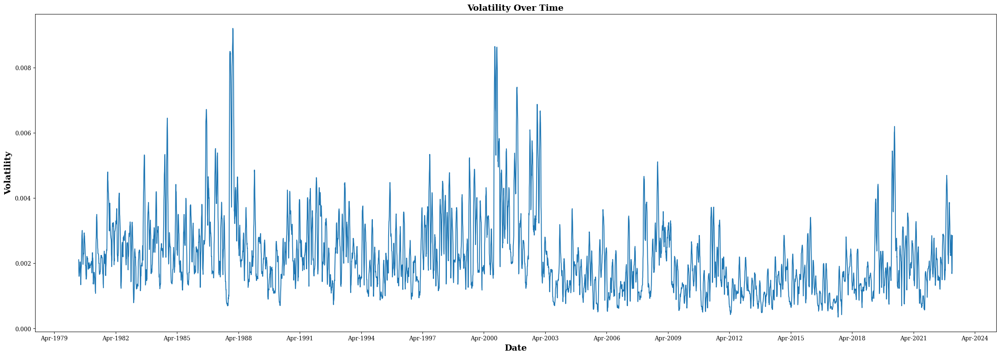

In [11]:

# Plot Volatility

# Convert the index to datetime format
chosen_stock.index = pd.to_datetime(chosen_stock.index)

# Set the DPI and figure size
fig, ax = plt.subplots(dpi=100, figsize=(30, 10))

# Create a line chart of volatility over time
ax.plot(chosen_stock.index, chosen_stock['volatility'])

# Format the x-axis labels
ax.xaxis.set_major_formatter(mdates.DateFormatter('%b-%Y'))
ax.xaxis.set_major_locator(mdates.MonthLocator(interval=36))

# labels and Tutle
ax.set_xlabel('Date', fontsize=fontsize, fontweight=fontweight)
ax.set_ylabel('Volatility', fontsize=fontsize, fontweight=fontweight)
ax.set_title('Volatility Over Time', fontsize=fontsize, fontweight=fontweight)
plt.show()

# verification 
print(chosen_stock.index.max())
print(chosen_stock.index.min())

In [12]:
def zscore_normalize(df):
    """
    Normalize the given pandas DataFrame using Z-score normalization.
    
    Parameters:
    -----------
    df : pandas DataFrame
        The DataFrame to be normalized
    
    Returns:
    --------
        data_mean : pandas Series
            Mean value of each column in the input DataFrame
        data_std : pandas Series
            Standard deviation of each column in the input DataFrame
        df_scaled : pandas DataFrame
            Normalized DataFrame with Z-score normalization applied
    """
    # Calculate mean and standard deviation for each column in the DataFrame
    data_mean = df.mean()
    data_std = df.std()
    
    # Normalize the DataFrame using Z-score normalization
    df_scaled = (df - data_mean) / data_std
    
    return data_mean, data_std, df_scaled

# Normalize the given DataFrame using Z-score normalization
data_mean, data_std, df_scaled = zscore_normalize(df)

2023-02-27 00:00:00
1980-06-10 00:00:00


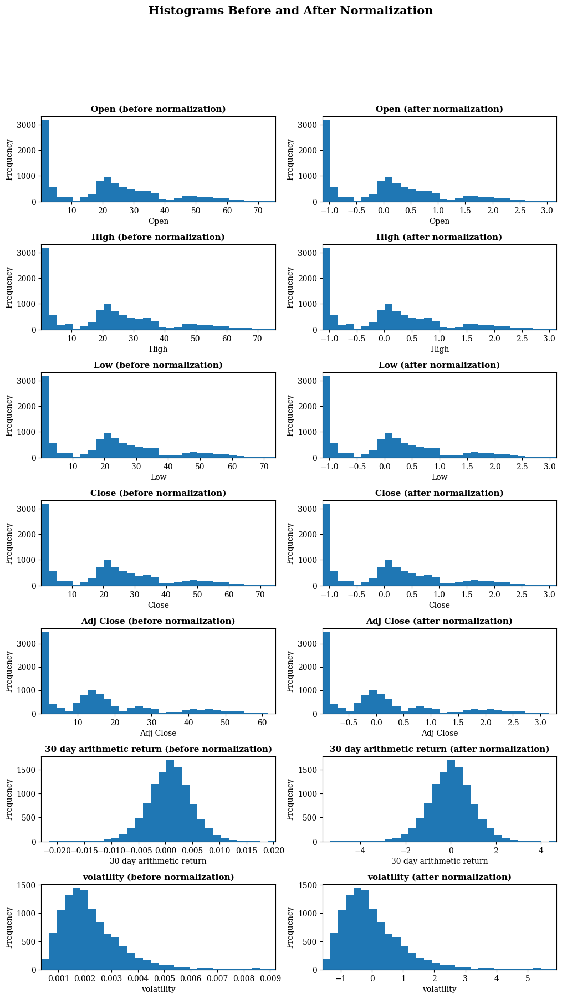

In [13]:
def plot_hist(df, df_scaled):
    """
    Plot histograms of each column in a DataFrame before and after normalization using Z-score.
    
    Parameters:
    -----------
    df: pandas.DataFrame
        The DataFrame containing the original data.
        
    df_scaled: pandas.DataFrame
        The DataFrame containing the normalized data using Z-score.
    
    Returns:
    --------
    None
    
    """
    
    # Get the column names
    cols = df.columns
    n_cols = len(cols)

    # Set the figure size
    fig, axs = plt.subplots(n_cols, 2, figsize=(12, 20))

    # Plot histograms of each column before normalization
    for i, col in enumerate(cols):
        axs[i][0].hist(df[col], bins=30)
        axs[i][0].set_title(f'{col} (before normalization)', fontsize = fontsize-4, fontweight = fontweight)
        axs[i][0].set_xlabel(col)
        axs[i][0].set_ylabel('Frequency')
        axs[i][0].set_xlim([df[col].min(), df[col].max()])

    # Plot histograms of each column after normalization
    for i, col in enumerate(cols):
        axs[i][1].hist(df_scaled[col], bins=30)
        axs[i][1].set_title(f'{col} (after normalization)', fontsize = fontsize-4, fontweight = fontweight)
        axs[i][1].set_xlabel(col)
        axs[i][1].set_ylabel('Frequency')
        axs[i][1].set_xlim([df_scaled[col].min(), df_scaled[col].max()])

    # Add a title to the plot
    fig.suptitle('Histograms Before and After Normalization', fontsize = fontsize, fontweight = fontweight)

    # Adjust spacing between subplots
    plt.subplots_adjust(hspace=0.5)

    # Show the plot
    plt.show()


# Call the function to plot histograms before and after normalization
plot_hist(df, df_scaled)

In [14]:
def create_input_output_pairs(data, look_back, horizon):
    """
    Create input-output pairs for time series forecasting using a sliding window approach.

    Parameters:
    -----------
    data : dataframe
        A dataframe of shape (n_samples, n_features).
    look_back : int
        The number of time steps to look back when creating input sequences.
    horizon : int
        The number of time steps to predict into the future.

    Returns:
    --------
    X : numpy array

    y : numpy array
    
    """
    X, y = [], []
    for i in range(len(data)-look_back-horizon+1):
        X.append(data[i:i+look_back, :])
        y.append(data[i+look_back:i+look_back+horizon, -1])
    return np.array(X), np.array(y)


In [15]:
def loss_evaluation(X, y):
    """
    Evaluate the loss and mean absolute error (MAE) of the model on the given input and output data.

    Parameters:
    X (numpy.ndarray)
    y (numpy.ndarray)

    Returns:
    Two float values: The loss and MAE of the model on the given data.
    """
    loss, mae = model.evaluate(X, y, verbose=0)
    return loss, mae


In [16]:
def denormalize_ftn(data):
    """
    Denormalizes the data using the previously calculated mean and standard deviation.

    Parameters:
    data (numpy array): Normalized data to be denormalized.

    Returns:
    numpy array: Denormalized data.
    """
    # Multiply normalized data with standard deviation of last column and add the mean of last column
    denormalized = data * data_std[-1] + data_mean[-1]
    return denormalized

In [17]:
def create_lstm_model(X_train, y_train, n_neurons, num_steps_in, num_steps_out, features_n, learning_rate=0.001, n_epoch=50, n_batch=64, dropout_rate=0.1, optimizer='adam'):
    """
    Creates an LSTM model for time series prediction.

    Args:
    - X_train (ndarray): numpy array representing the input training data.
    - y_train (ndarray): numpy array representing the output training data.
    - n_neurons (int): Number of neurons in the LSTM layers.
    - num_steps_in (int): Number of time steps used for input data. [look_back]
    - num_steps_out (int): Number of time steps to predict for the output. [horizon]
    - features_n (int): Number of features in the input data.
    - learning_rate (float): Learning rate for the optimizer. Default is 0.001.
    - n_epoch (int): Number of epochs to train the model. Default is 50.
    - n_batch (int): Batch size for training. Default is 64.
    - dropout_rate (float): Dropout rate for regularization. Default is 0.1.
    - optimizer (str): Name of the optimizer to use. Default is 'adam'.

    Returns:
    - model (LSTM model): The trained LSTM model.
    - history (History): The history object of the model's training process.

    """
    # create LSTM model
    model = Sequential()
    model.add(LSTM(n_neurons, input_shape=(num_steps_in, features_n), return_sequences=True, activation='elu'))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(n_neurons//2, return_sequences=True, activation='elu'))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(n_neurons//4, activation='elu'))
    model.add(Dense(num_steps_out))
    model.add(Activation('linear'))

    # set optimizer
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adagrad':
        opt = Adagrad(learning_rate=learning_rate)
    elif optimizer == 'adadelta':
        opt = Adadelta(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        opt = SGD(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer specified')
    
    model.compile(optimizer = opt, loss='mse', metrics=['mae'])

    # define early stopping criteria
    earlystop = EarlyStopping(monitor = 'val_loss', min_delta = 0.001, patience = 7, verbose = 1, mode = 'auto', restore_best_weights = True)

    # train LSTM with early stopping
    history = model.fit(X_train, y_train, epochs = n_epoch, batch_size = n_batch, verbose = 1, validation_split = 0.1, callbacks = [earlystop])
    
    return model, history


In [18]:
def plot_metrics(history, title_label):
    """
    Plot the training and validation metrics over the epochs.

    Parameters:
        history (keras.callbacks.History): A Keras History object containing the training and validation metrics.
        title_label (str): A string that will be included in the title of the plot.

    Returns:
        None
    """
    # Plot the training and validation loss over the epochs
    plt.plot(history.history['loss'], label='Training Loss')
    plt.plot(history.history['val_loss'], label='Validation Loss')

    # Plot the training and validation MAE over the epochs
    plt.plot(history.history['mae'], label='Training MAE')
    plt.plot(history.history['val_mae'], label='Validation MAE')

    # Add a title to the plot using the title_label argument
    plt.title(f'Training and Validation Metrics - {title_label}')

    # Label the x- and y-axes
    plt.xlabel('Epoch')
    plt.ylabel('Metric Value')

    # Add a legend to the plot
    plt.legend()

    # Display the plot
    plt.show()

In [19]:
def plot_predictions(model, history, X_test, y_test, title, end_date):
    """
    This function generates and plots the predicted and actual values for the test set,
    along with the test loss and validation loss.

    Parameters:
        model (keras.Model): The trained LSTM model.
        X_test (numpy.ndarray): The input sequences for the test set.
        y_test (numpy.ndarray): The output sequences for the test set.

    Returns:
        None.
    """
    # Generate predictions for the test set
    y_pred = model.predict(X_test)

    # Calculate test loss and validation loss
    test_loss = model.evaluate(X_test, y_test)[0]
    val_loss = np.mean(history.history['val_loss'])
    
    
    # Create date range for x-axis based on length of y_test

    date_range = pd.date_range(end=end_date, periods=len(y_test), freq='D')

    # Calculate the mean by rows
    y_test = np.mean(y_test, axis=1)
    y_pred = np.mean(y_pred, axis=1)

    # Plot actual and predicted values
    fig, ax = plt.subplots(figsize=(20, 7))
    ax.plot(date_range, denormalize_ftn(y_test), label='Actual', color='blue')
    ax.plot(date_range, denormalize_ftn(y_pred), label='Predicted', linestyle='--', color='red')

    # Format x-axis to display only months
    ax.xaxis.set_major_formatter(mdates.DateFormatter('%m-%Y'))
    ax.xaxis.set_major_locator(mdates.MonthLocator(interval=4))
    ax.tick_params(axis='x', labelrotation=45)

    # Add test loss and validation loss to plot
    ax.annotate(f'Test Loss: {test_loss:.3f}\nAvg Validation Loss: {val_loss:.3f}',
                 xy=(0.05, 0.8), xycoords='axes fraction', fontsize=12)


    # Add legend and labels
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.title(f'Actual vs. Predicted Values for {title}')

    plt.show()

In [20]:
def plot_predictions_with_training_data(model, history, X_test, y_test, y_train, plot_title, end_date_test):
    """
    This function generates and plots the predicted and actual values for the test set,
    along with the actual values for the training set.

    Parameters:
        model (keras.Model): The trained LSTM model.
        X_test (numpy.ndarray): The input sequences for the test set.
        y_test (numpy.ndarray): The output sequences for the test set.
        y_train (numpy.ndarray): The output sequences for the training set.
        plot_title (str): The title for the plot.
        end_date (str): The end date for the test set in the format 'YYYY-MM-DD'.

    Returns:
        None.
    """
    # Generate predictions for the test set
    y_pred = model.predict(X_test)

   # Calculate test loss and validation loss
    test_loss = model.evaluate(X_test, y_test)[0]
    val_loss = np.mean(history.history['val_loss'])

    # Calculate denormalized versions
    y_train = denormalize_ftn(y_train)
    y_test = denormalize_ftn(y_test)
    y_pred = denormalize_ftn(y_pred)
    

    # Calculate the mean by rows
    y_train = np.mean(y_train, axis=1)
    y_test = np.mean(y_test, axis=1)
    y_pred = np.mean(y_pred, axis=1)
    



    # Get the length of the training set
    n_train = y_train.shape[0]

    # Get the length of the test set
    n_test = y_test.shape[0]

    # Generate the x-axis values
    x_train = np.arange(0, n_train)
    x_test = np.arange(n_train, n_train + n_test)

    # Plot the data
    fig, ax = plt.subplots(figsize=(20, 7))
    ax.plot(x_train, y_train, label='Training Data', color = 'green')
    ax.plot(x_test, y_test, label='Test Data', color = 'blue')
    ax.plot(x_test, y_pred, label='Predicted Data', color = 'red', linestyle = '--')

    # Add test loss and validation loss to plot
    ax.annotate(f'Test Loss: {test_loss:.3f}\nAvg Validation Loss: {val_loss:.3f}',
                 xy=(0.05, 0.8), xycoords='axes fraction', fontsize=12)

    # Add legend and labels
    plt.legend()
    plt.xlabel('Date')
    plt.ylabel('Volatility')
    plt.title(f'Actual vs. Predicted Values for {plot_title} - Predictions upto {end_date_test}')

    plt.show()


In [21]:
# Initialize lists to store hyperparameters and corresponding test losses
hyperparameters = []
test_losses = []
def determine_best_hyperparameters(df):
    """
    This function determines the best hyperparameters for the LSTM model by looping through different
    values of look back and horizon and finding the combination that results in the lowest test loss.
    
    Also plots losses for look_back, horizon pairs

    Parameters:
        df (pandas.DataFrame): The dataframe containing the time series data.
        
    Returns:
        Tuple: The best hyperparameters for the LSTM model and the corresponding test loss.
    """
    global best_hyperparameters
    best_hyperparameters = None
    best_test_loss = float('inf')
    
    # Split data into train and test sets
    train_data, test_data = train_test_split(df_scaled, test_size=0.2, shuffle=False)
    
    # Define ranges for hyperparameters
    # lb_range = [7, 14, 30]
    # horizon_range = range(2, 3)
    lb_range = [7, 14, 30, 60, 90]
    horizon_range = range(1, 5)
    

    # Loop through hyperparameter ranges
    for look_back in lb_range:
        for horizon in horizon_range:
            # Ensure that look_back is at least 4 times the horizon
            if look_back >= 4 * horizon:
                print(f"\n Current Iteration: \n\t Look Back : {look_back} \n\t Horizon : {horizon}")

                # Create input-output pairs for LSTM model
                X_train, y_train = create_input_output_pairs(train_data.values, look_back, horizon)
                X_test, y_test = create_input_output_pairs(test_data.values, look_back, horizon)

                # Create and train LSTM model
                model, history = create_lstm_model( X_train, y_train, n_neurons = 64, num_steps_in = look_back, 
                                                    num_steps_out = horizon, features_n = df.shape[1], 
                                                    learning_rate = 0.005, n_epoch = 50, n_batch = 64, 
                                                    dropout_rate = 0.1, optimizer = 'adam')
                plot_metrics(history, f"Stock: {stock_name} with Lookback / Horizon : {look_back} / {horizon}")

                # Evaluate model on test set
                test_loss = model.evaluate(X_test, y_test)[0]

                end_date = df_scaled.index[-1]
                # Plot actual vs. predicted values for test set
                plot_predictions(model, history, X_test, y_test, f"Stock: {stock_name} with Look-back {look_back} and horizon {horizon}", end_date)
                plot_predictions_with_training_data(model, history, X_test, y_test, y_train, f"Training Data, Predicted and Actual Voltility - Stock: {stock_name} with Look-back {look_back} and horizon {horizon}", end_date)

                # Append hyperparameters and corresponding test loss to lists
                hyperparameters.append((look_back, horizon))
                test_losses.append(test_loss)
                print(f"\n Test Loss of {test_loss} with a look-back {look_back} and horizon {horizon}")
    
                
                # Update best hyperparameters and test loss if new best is found
                if test_loss < best_test_loss:
                    best_hyperparameters = (look_back, horizon)
                    best_test_loss = test_loss
                    print(f"\n Best Test Loss of {best_test_loss} with a look-back {look_back} and horizon {horizon}")

    # Plot test losses
    plt.figure(figsize=(10, 5))
    plt.plot(test_losses, 'o-')
    plt.ylabel('Test Loss')
    plt.xticks([])
    plt.title('Test Loss for Hyperparameters')
    for i, loss in enumerate(test_losses):
        plt.annotate(f'LB/H:{hyperparameters[i]}', xy=(i, loss), xytext=(-10,10), textcoords='offset points')

    plt.show()

    return best_hyperparameters, best_test_loss



 Current Iteration: 
	 Look Back : 7 
	 Horizon : 1
Epoch 1/50
122/122 [==============================] - 10s 34ms/step - loss: 0.1802 - mae: 0.2804 - val_loss: 0.0175 - val_mae: 0.1004
Epoch 2/50
122/122 [==============================] - 4s 30ms/step - loss: 0.0269 - mae: 0.1166 - val_loss: 0.0056 - val_mae: 0.0554
Epoch 3/50
122/122 [==============================] - 2s 19ms/step - loss: 0.0181 - mae: 0.0954 - val_loss: 0.0046 - val_mae: 0.0526
Epoch 4/50
122/122 [==============================] - 2s 19ms/step - loss: 0.0126 - mae: 0.0790 - val_loss: 0.0030 - val_mae: 0.0408
Epoch 5/50
122/122 [==============================] - 4s 30ms/step - loss: 0.0119 - mae: 0.0756 - val_loss: 0.0044 - val_mae: 0.0546
Epoch 6/50
122/122 [==============================] - 4s 31ms/step - loss: 0.0098 - mae: 0.0696 - val_loss: 0.0031 - val_mae: 0.0449
Epoch 7/50
122/122 [==============================] - 2s 19ms/step - loss: 0.0099 - mae: 0.0699 - val_loss: 0.0025 - val_mae: 0.0394
Epoch 8/50
122/

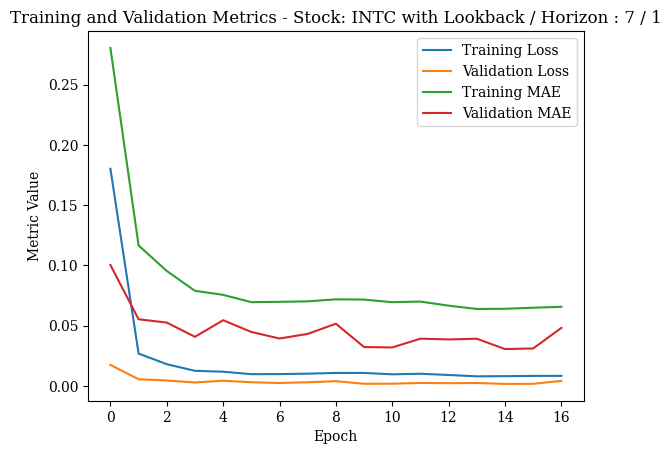

68/68 [==============================] - 1s 8ms/step - loss: 0.0058 - mae: 0.0538


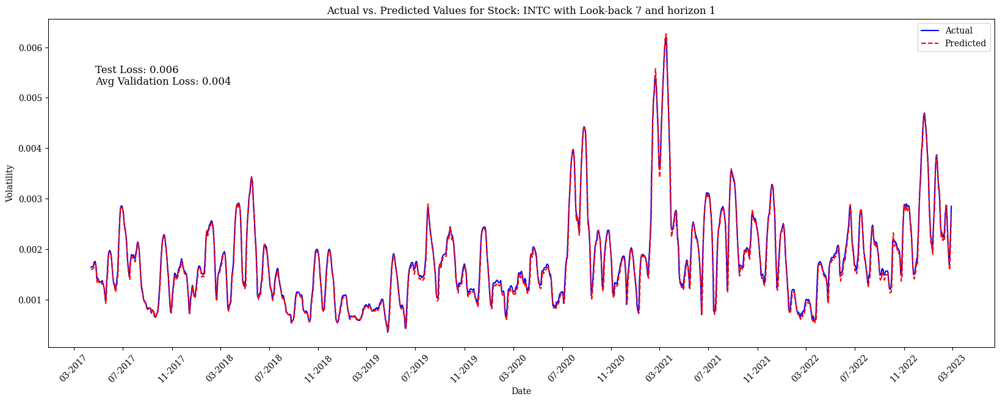

68/68 [==============================] - 0s 6ms/step - loss: 0.0058 - mae: 0.0538


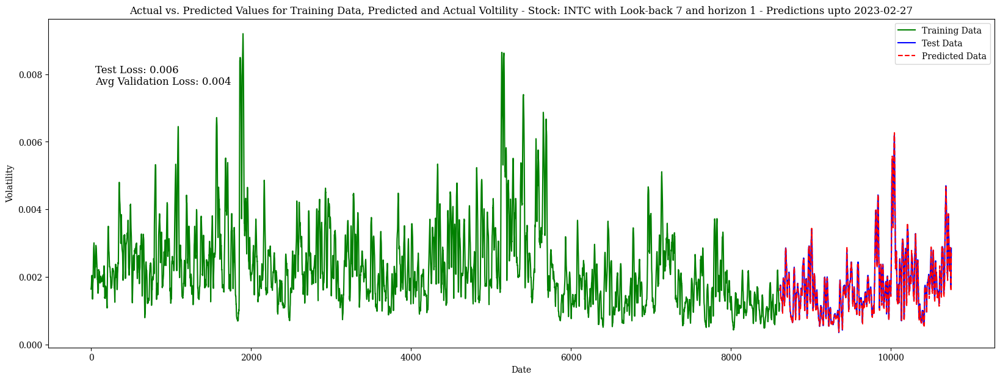


 Test Loss of 0.005828014109283686 with a look-back 7 and horizon 1

 Best Test Loss of 0.005828014109283686 with a look-back 7 and horizon 1

 Current Iteration: 
	 Look Back : 14 
	 Horizon : 1
Epoch 1/50
121/121 [==============================] - 12s 57ms/step - loss: 0.2534 - mae: 0.3312 - val_loss: 0.0172 - val_mae: 0.0971
Epoch 2/50
121/121 [==============================] - 5s 44ms/step - loss: 0.0395 - mae: 0.1443 - val_loss: 0.0076 - val_mae: 0.0637
Epoch 3/50
121/121 [==============================] - 4s 35ms/step - loss: 0.0234 - mae: 0.1104 - val_loss: 0.0084 - val_mae: 0.0787
Epoch 4/50
121/121 [==============================] - 6s 48ms/step - loss: 0.0181 - mae: 0.0962 - val_loss: 0.0036 - val_mae: 0.0451
Epoch 5/50
121/121 [==============================] - 6s 53ms/step - loss: 0.0165 - mae: 0.0910 - val_loss: 0.0031 - val_mae: 0.0422
Epoch 6/50
121/121 [==============================] - 4s 34ms/step - loss: 0.0141 - mae: 0.0825 - val_loss: 0.0027 - val_mae: 0.0378
Epoc

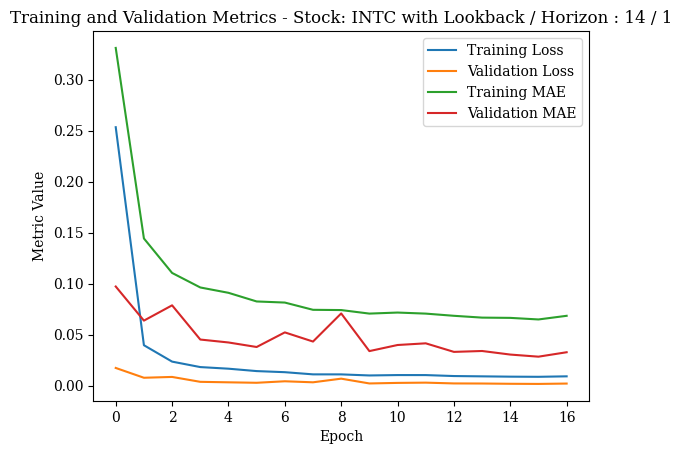

67/67 [==============================] - 1s 10ms/step - loss: 0.0076 - mae: 0.0629


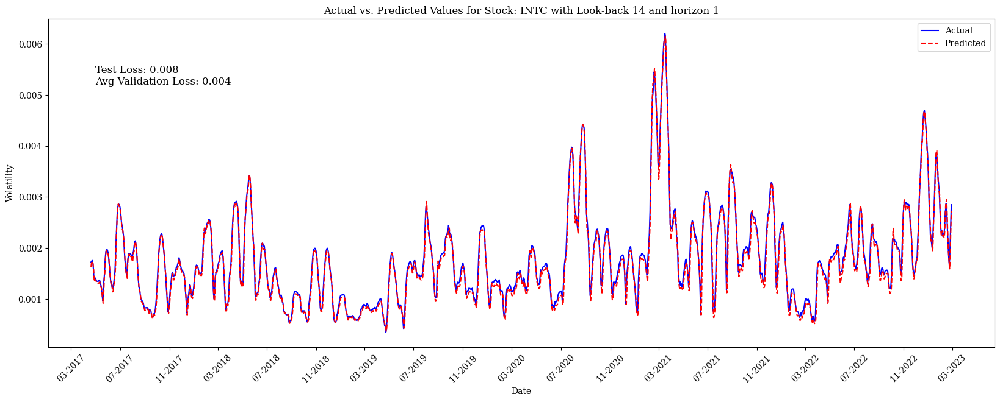

67/67 [==============================] - 1s 12ms/step - loss: 0.0076 - mae: 0.0629


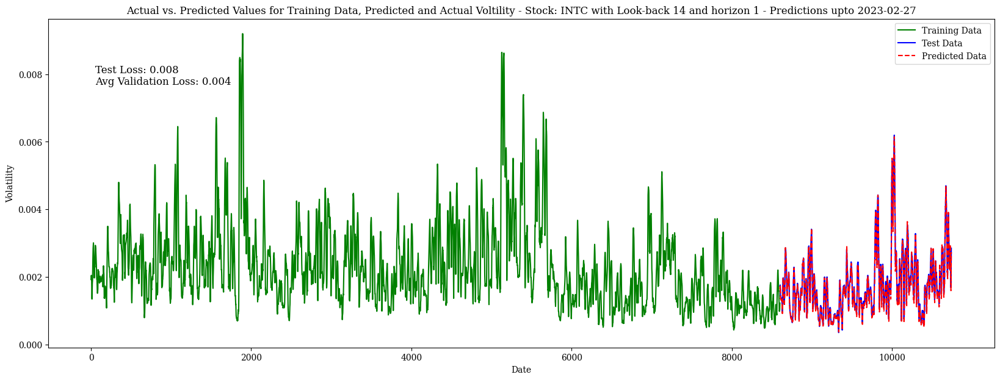


 Test Loss of 0.007628579158335924 with a look-back 14 and horizon 1

 Current Iteration: 
	 Look Back : 14 
	 Horizon : 2
Epoch 1/50
121/121 [==============================] - 11s 42ms/step - loss: 0.2428 - mae: 0.3119 - val_loss: 0.0262 - val_mae: 0.1312
Epoch 2/50
121/121 [==============================] - 5s 40ms/step - loss: 0.0399 - mae: 0.1436 - val_loss: 0.0116 - val_mae: 0.0774
Epoch 3/50
121/121 [==============================] - 7s 59ms/step - loss: 0.0292 - mae: 0.1210 - val_loss: 0.0091 - val_mae: 0.0695
Epoch 4/50
121/121 [==============================] - 5s 41ms/step - loss: 0.0246 - mae: 0.1127 - val_loss: 0.0072 - val_mae: 0.0633
Epoch 5/50
121/121 [==============================] - 5s 38ms/step - loss: 0.0214 - mae: 0.1025 - val_loss: 0.0073 - val_mae: 0.0683
Epoch 6/50
121/121 [==============================] - 6s 49ms/step - loss: 0.0191 - mae: 0.0981 - val_loss: 0.0070 - val_mae: 0.0647
Epoch 7/50
121/121 [==============================] - 7s 54ms/step - loss: 0.

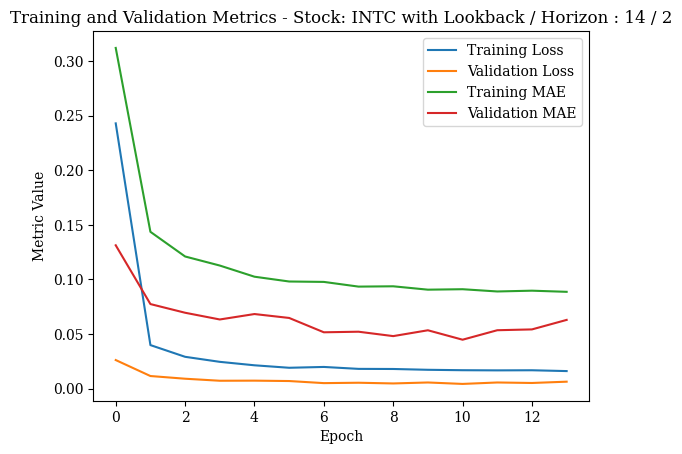

67/67 [==============================] - 1s 10ms/step - loss: 0.0118 - mae: 0.0744


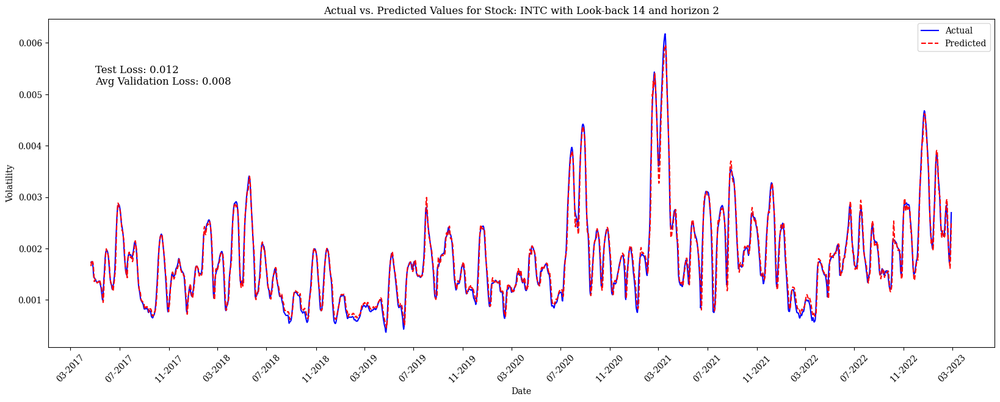

67/67 [==============================] - 1s 10ms/step - loss: 0.0118 - mae: 0.0744


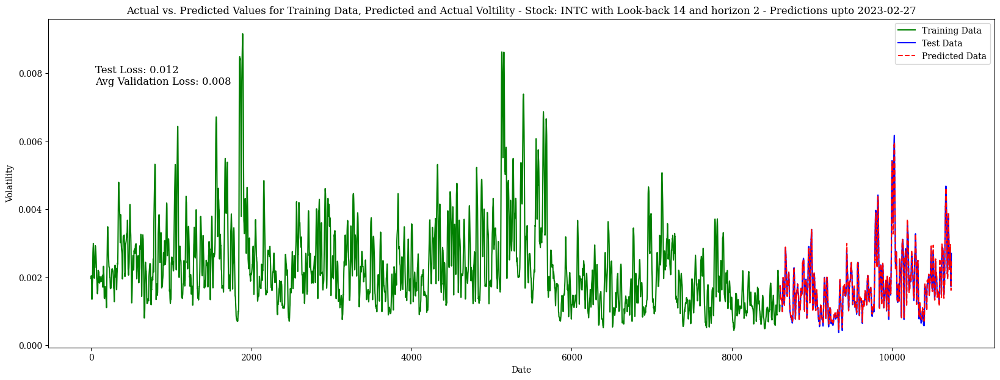


 Test Loss of 0.011818361468613148 with a look-back 14 and horizon 2

 Current Iteration: 
	 Look Back : 14 
	 Horizon : 3
Epoch 1/50
121/121 [==============================] - 12s 46ms/step - loss: 0.2863 - mae: 0.3549 - val_loss: 0.0509 - val_mae: 0.1868
Epoch 2/50
121/121 [==============================] - 6s 47ms/step - loss: 0.0565 - mae: 0.1703 - val_loss: 0.0208 - val_mae: 0.1132
Epoch 3/50
121/121 [==============================] - 8s 65ms/step - loss: 0.0442 - mae: 0.1483 - val_loss: 0.0121 - val_mae: 0.0790
Epoch 4/50
121/121 [==============================] - 5s 40ms/step - loss: 0.0384 - mae: 0.1364 - val_loss: 0.0099 - val_mae: 0.0696
Epoch 5/50
121/121 [==============================] - 5s 41ms/step - loss: 0.0319 - mae: 0.1239 - val_loss: 0.0095 - val_mae: 0.0674
Epoch 6/50
121/121 [==============================] - 7s 62ms/step - loss: 0.0299 - mae: 0.1191 - val_loss: 0.0102 - val_mae: 0.0728
Epoch 7/50
121/121 [==============================] - 6s 53ms/step - loss: 0.

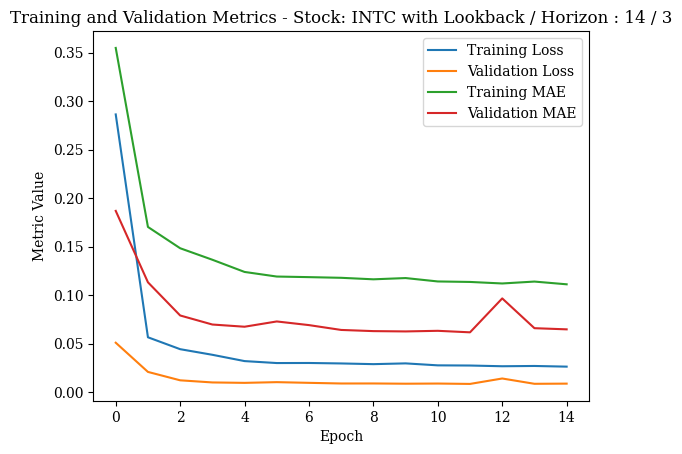

67/67 [==============================] - 1s 10ms/step - loss: 0.0208 - mae: 0.0974


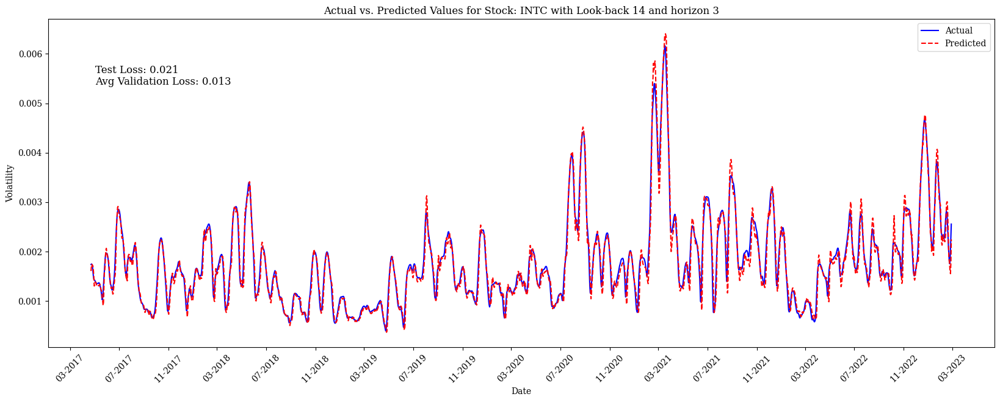

67/67 [==============================] - 1s 11ms/step - loss: 0.0208 - mae: 0.0974


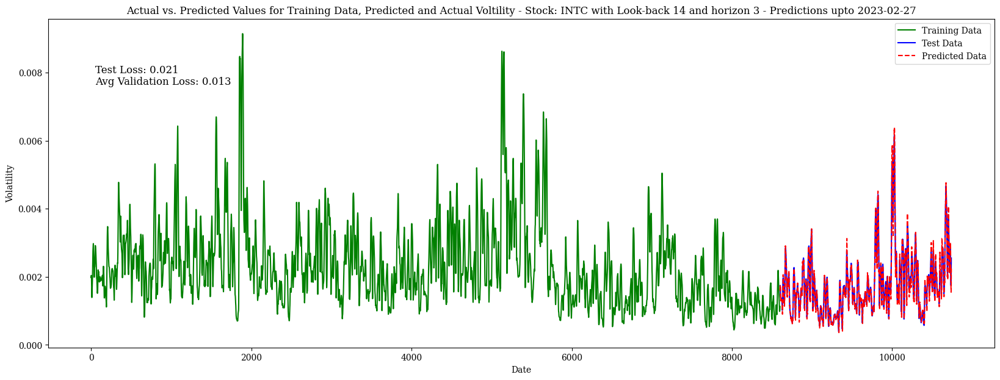


 Test Loss of 0.020831149071455002 with a look-back 14 and horizon 3

 Current Iteration: 
	 Look Back : 30 
	 Horizon : 1
Epoch 1/50
121/121 [==============================] - 16s 89ms/step - loss: 0.1755 - mae: 0.2592 - val_loss: 0.0204 - val_mae: 0.1127
Epoch 2/50
121/121 [==============================] - 11s 92ms/step - loss: 0.0341 - mae: 0.1339 - val_loss: 0.0088 - val_mae: 0.0686
Epoch 3/50
121/121 [==============================] - 11s 91ms/step - loss: 0.0215 - mae: 0.1059 - val_loss: 0.0109 - val_mae: 0.0842
Epoch 4/50
121/121 [==============================] - 11s 87ms/step - loss: 0.0196 - mae: 0.0969 - val_loss: 0.0047 - val_mae: 0.0505
Epoch 5/50
121/121 [==============================] - 12s 103ms/step - loss: 0.0159 - mae: 0.0882 - val_loss: 0.0029 - val_mae: 0.0396
Epoch 6/50
121/121 [==============================] - 10s 78ms/step - loss: 0.0112 - mae: 0.0763 - val_loss: 0.0027 - val_mae: 0.0381
Epoch 7/50
121/121 [==============================] - 12s 101ms/step - 

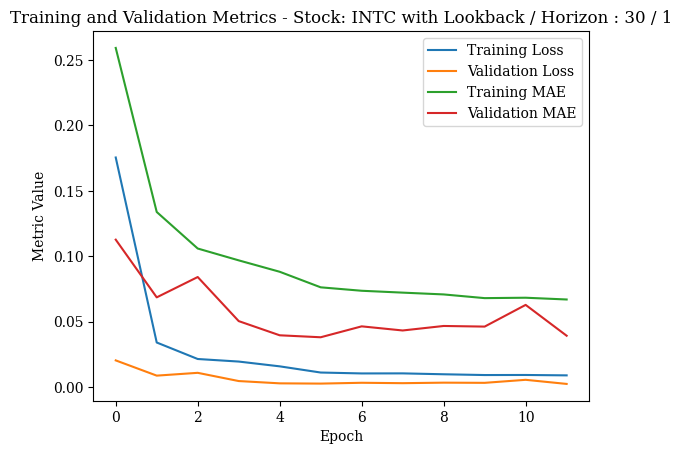

67/67 [==============================] - 1s 20ms/step - loss: 0.0110 - mae: 0.0741


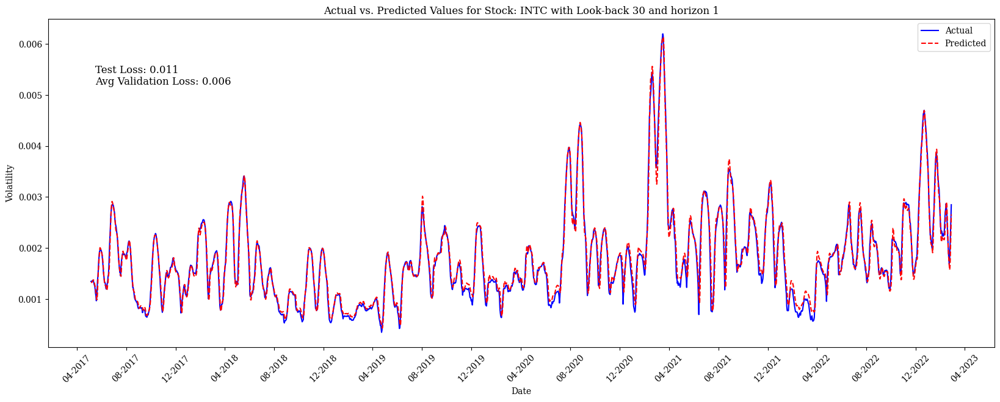

67/67 [==============================] - 2s 22ms/step - loss: 0.0110 - mae: 0.0741


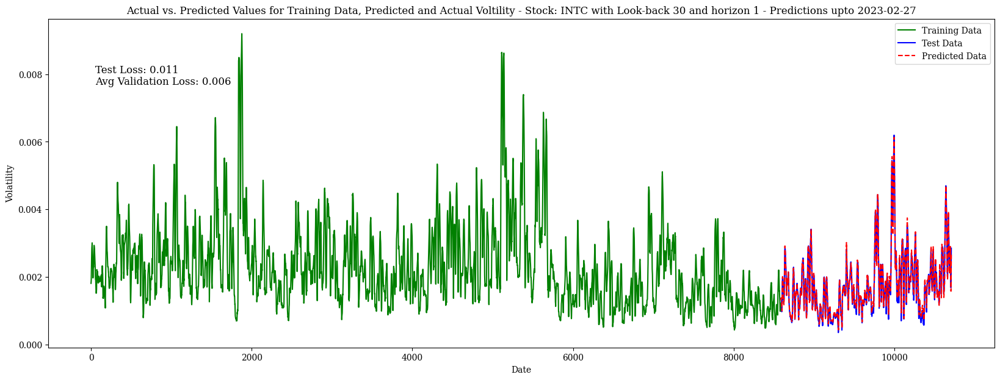


 Test Loss of 0.011020787060260773 with a look-back 30 and horizon 1

 Current Iteration: 
	 Look Back : 30 
	 Horizon : 2
Epoch 1/50
121/121 [==============================] - 19s 102ms/step - loss: 0.3270 - mae: 0.3729 - val_loss: 0.0464 - val_mae: 0.1796
Epoch 2/50
121/121 [==============================] - 11s 92ms/step - loss: 0.0645 - mae: 0.1824 - val_loss: 0.0274 - val_mae: 0.1378
Epoch 3/50
121/121 [==============================] - 13s 104ms/step - loss: 0.0427 - mae: 0.1498 - val_loss: 0.0184 - val_mae: 0.1123
Epoch 4/50
121/121 [==============================] - 10s 85ms/step - loss: 0.0303 - mae: 0.1249 - val_loss: 0.0085 - val_mae: 0.0677
Epoch 5/50
121/121 [==============================] - 13s 107ms/step - loss: 0.0280 - mae: 0.1191 - val_loss: 0.0069 - val_mae: 0.0616
Epoch 6/50
121/121 [==============================] - 10s 85ms/step - loss: 0.0235 - mae: 0.1083 - val_loss: 0.0065 - val_mae: 0.0566
Epoch 7/50
121/121 [==============================] - 12s 102ms/step 

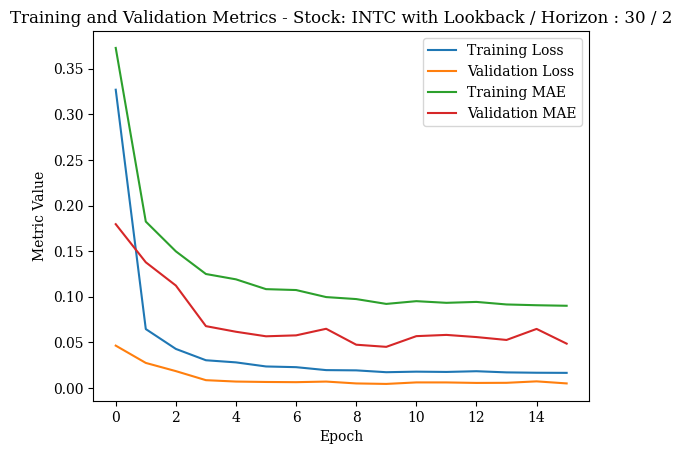

67/67 [==============================] - 2s 25ms/step - loss: 0.0194 - mae: 0.1009


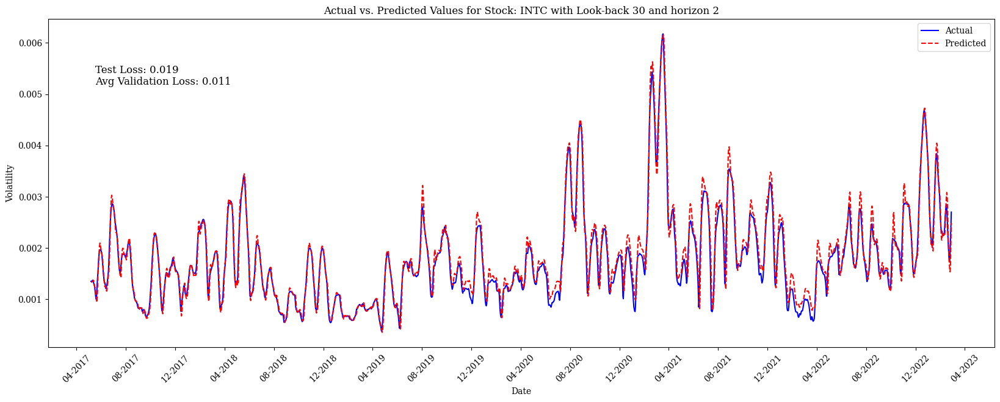

67/67 [==============================] - 1s 21ms/step - loss: 0.0194 - mae: 0.1009


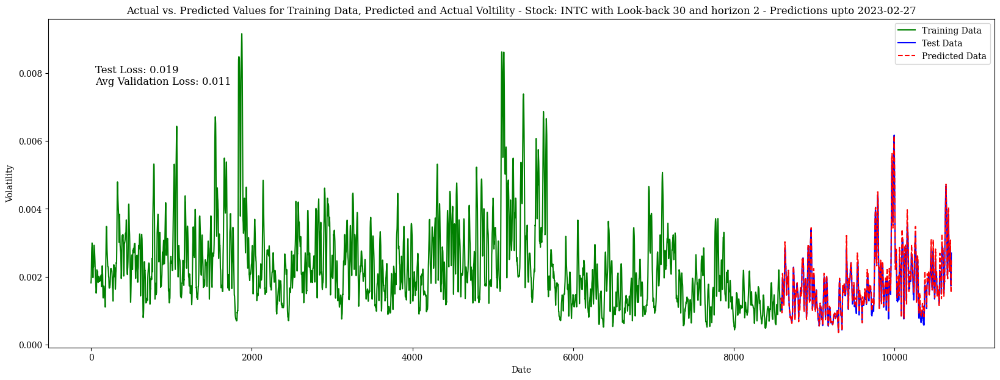


 Test Loss of 0.019388653337955475 with a look-back 30 and horizon 2

 Current Iteration: 
	 Look Back : 30 
	 Horizon : 3
Epoch 1/50
121/121 [==============================] - 18s 114ms/step - loss: 0.2574 - mae: 0.3286 - val_loss: 0.0427 - val_mae: 0.1680
Epoch 2/50
121/121 [==============================] - 12s 97ms/step - loss: 0.0576 - mae: 0.1693 - val_loss: 0.0185 - val_mae: 0.1013
Epoch 3/50
121/121 [==============================] - 12s 102ms/step - loss: 0.0437 - mae: 0.1470 - val_loss: 0.0144 - val_mae: 0.0858
Epoch 4/50
121/121 [==============================] - 12s 99ms/step - loss: 0.0340 - mae: 0.1288 - val_loss: 0.0117 - val_mae: 0.0750
Epoch 5/50
121/121 [==============================] - 12s 96ms/step - loss: 0.0318 - mae: 0.1241 - val_loss: 0.0111 - val_mae: 0.0718
Epoch 6/50
121/121 [==============================] - 13s 109ms/step - loss: 0.0322 - mae: 0.1245 - val_loss: 0.0107 - val_mae: 0.0726
Epoch 7/50
121/121 [==============================] - 10s 86ms/step -

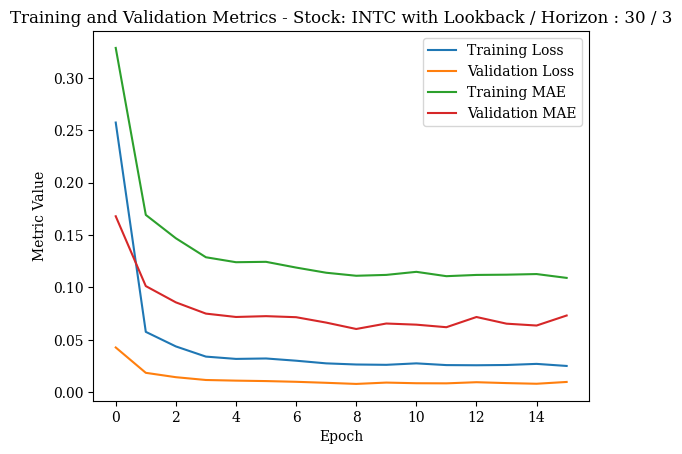

67/67 [==============================] - 1s 21ms/step - loss: 0.0235 - mae: 0.1095


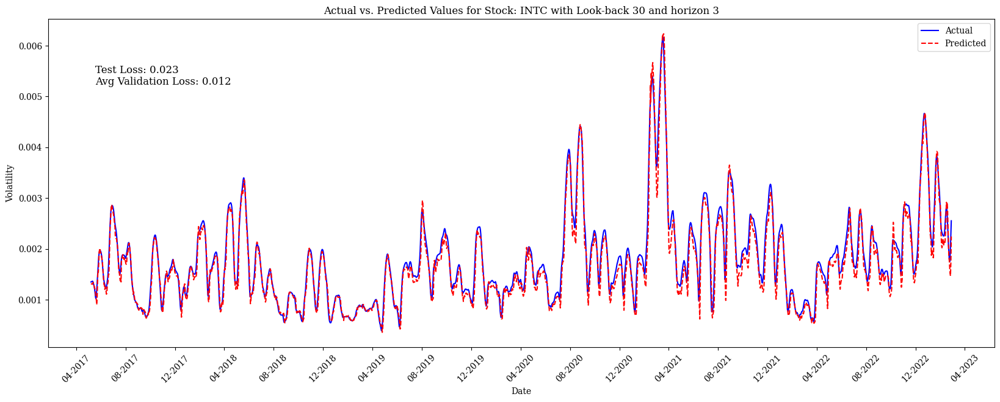

67/67 [==============================] - 1s 21ms/step - loss: 0.0235 - mae: 0.1095


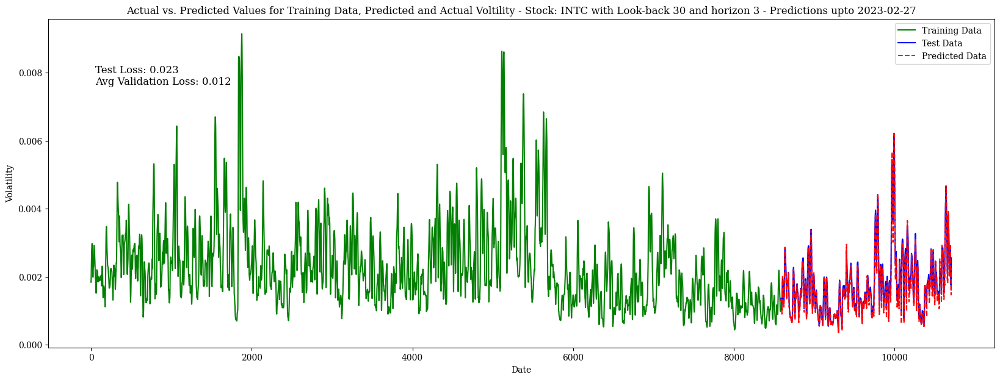


 Test Loss of 0.023495718836784363 with a look-back 30 and horizon 3

 Current Iteration: 
	 Look Back : 30 
	 Horizon : 4
Epoch 1/50
121/121 [==============================] - 18s 102ms/step - loss: 0.2981 - mae: 0.3695 - val_loss: 0.0505 - val_mae: 0.1768
Epoch 2/50
121/121 [==============================] - 13s 107ms/step - loss: 0.0769 - mae: 0.1962 - val_loss: 0.0292 - val_mae: 0.1244
Epoch 3/50
121/121 [==============================] - 12s 99ms/step - loss: 0.0607 - mae: 0.1709 - val_loss: 0.0194 - val_mae: 0.0985
Epoch 4/50
121/121 [==============================] - 13s 104ms/step - loss: 0.0505 - mae: 0.1547 - val_loss: 0.0157 - val_mae: 0.0865
Epoch 5/50
121/121 [==============================] - 13s 109ms/step - loss: 0.0490 - mae: 0.1514 - val_loss: 0.0162 - val_mae: 0.0902
Epoch 6/50
121/121 [==============================] - 12s 97ms/step - loss: 0.0454 - mae: 0.1445 - val_loss: 0.0189 - val_mae: 0.1049
Epoch 7/50
121/121 [==============================] - 13s 112ms/step

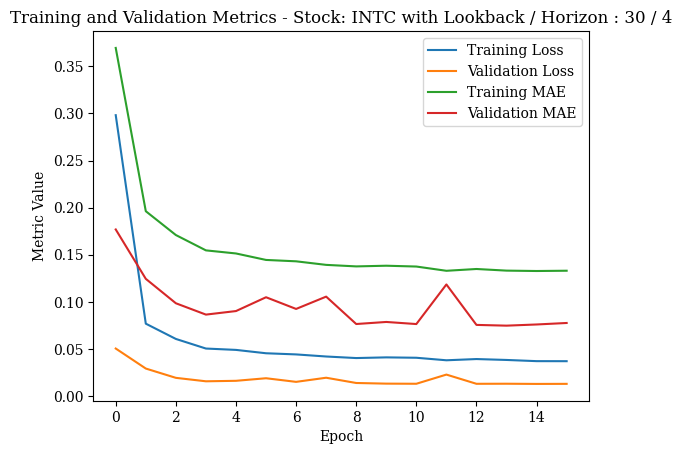

67/67 [==============================] - 2s 26ms/step - loss: 0.0336 - mae: 0.1208


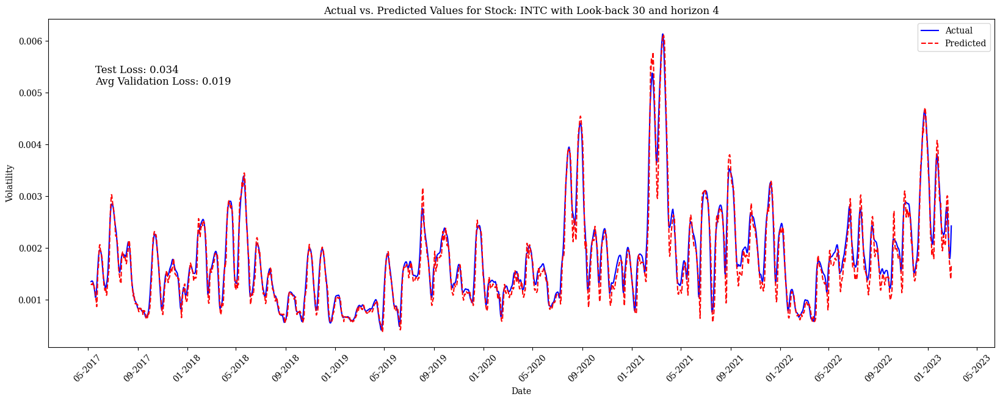

67/67 [==============================] - 1s 19ms/step - loss: 0.0336 - mae: 0.1208


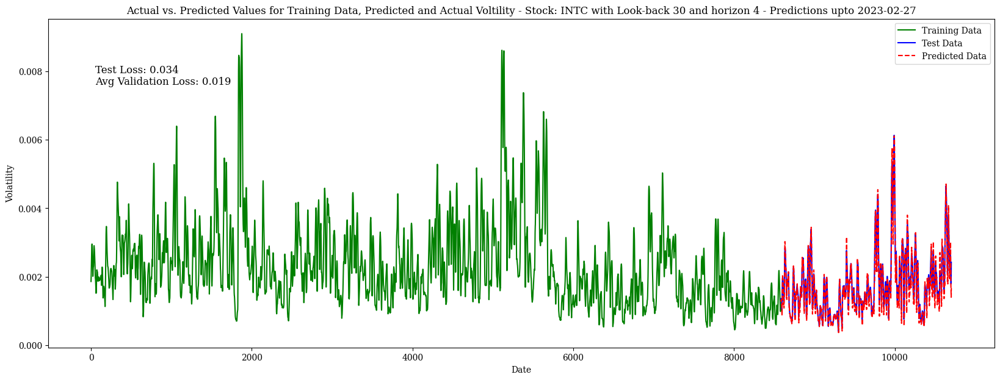


 Test Loss of 0.03358978033065796 with a look-back 30 and horizon 4

 Current Iteration: 
	 Look Back : 60 
	 Horizon : 1
Epoch 1/50
121/121 [==============================] - 27s 178ms/step - loss: 210387152.0000 - mae: 316.1581 - val_loss: 0.6171 - val_mae: 0.6986
Epoch 2/50
121/121 [==============================] - 21s 175ms/step - loss: 1.2743 - mae: 0.7873 - val_loss: 0.6140 - val_mae: 0.6965
Epoch 3/50
121/121 [==============================] - 21s 174ms/step - loss: 1.2752 - mae: 0.7875 - val_loss: 0.6142 - val_mae: 0.6967
Epoch 4/50
121/121 [==============================] - 21s 174ms/step - loss: 1.2744 - mae: 0.7874 - val_loss: 0.6145 - val_mae: 0.6969
Epoch 5/50
121/121 [==============================] - 20s 169ms/step - loss: 1.2722 - mae: 0.7870 - val_loss: 0.6149 - val_mae: 0.6971
Epoch 6/50
121/121 [==============================] - 21s 171ms/step - loss: 1.2760 - mae: 0.7885 - val_loss: 0.6153 - val_mae: 0.6974
Epoch 7/50
121/121 [==============================] - 21s

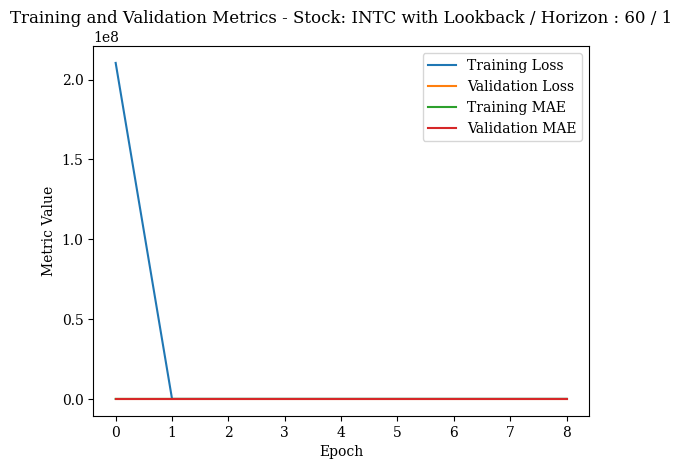

66/66 [==============================] - 3s 41ms/step - loss: 0.9732 - mae: 0.8413


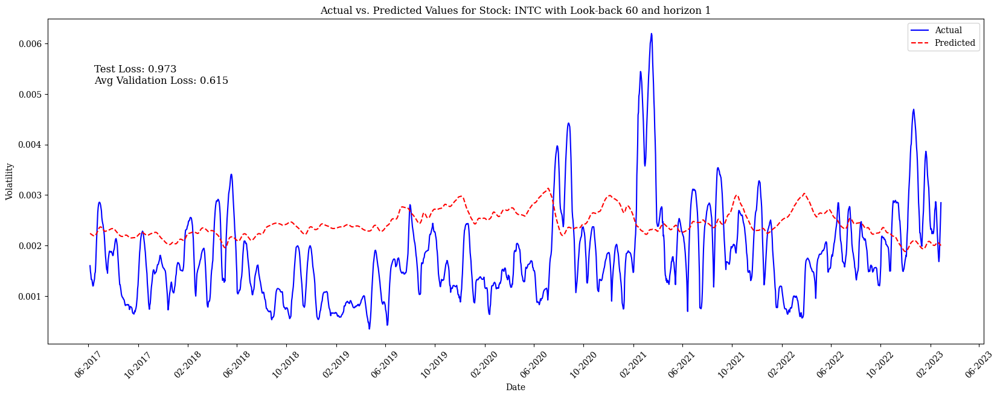

66/66 [==============================] - 2s 36ms/step - loss: 0.9732 - mae: 0.8413


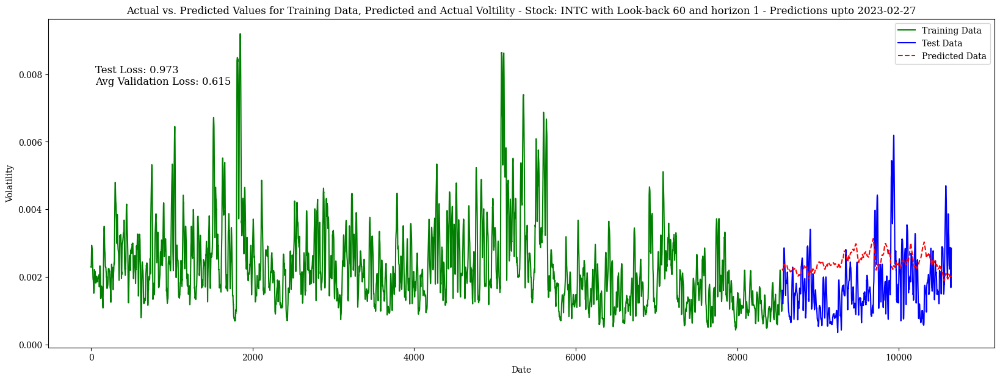


 Test Loss of 0.9732277989387512 with a look-back 60 and horizon 1

 Current Iteration: 
	 Look Back : 60 
	 Horizon : 2
Epoch 1/50
121/121 [==============================] - 28s 190ms/step - loss: 41642.4102 - mae: 6.1994 - val_loss: 0.5311 - val_mae: 0.6522
Epoch 2/50
121/121 [==============================] - 22s 186ms/step - loss: 1.0946 - mae: 0.7189 - val_loss: 0.5379 - val_mae: 0.6571
Epoch 3/50
121/121 [==============================] - 25s 205ms/step - loss: 1.0875 - mae: 0.7173 - val_loss: 0.5469 - val_mae: 0.6635
Epoch 4/50
121/121 [==============================] - 22s 179ms/step - loss: 1.0797 - mae: 0.7152 - val_loss: 0.5577 - val_mae: 0.6711
Epoch 5/50
121/121 [==============================] - 21s 172ms/step - loss: 1.0713 - mae: 0.7132 - val_loss: 0.5701 - val_mae: 0.6797
Epoch 6/50
121/121 [==============================] - 21s 174ms/step - loss: 1.0624 - mae: 0.7112 - val_loss: 0.5839 - val_mae: 0.6891
Epoch 7/50
121/121 [==============================] - 21s 176ms/

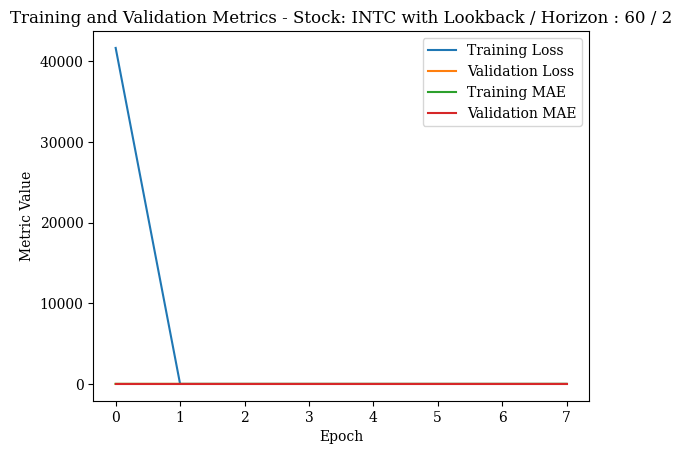

66/66 [==============================] - 2s 37ms/step - loss: 0.5928 - mae: 0.6145


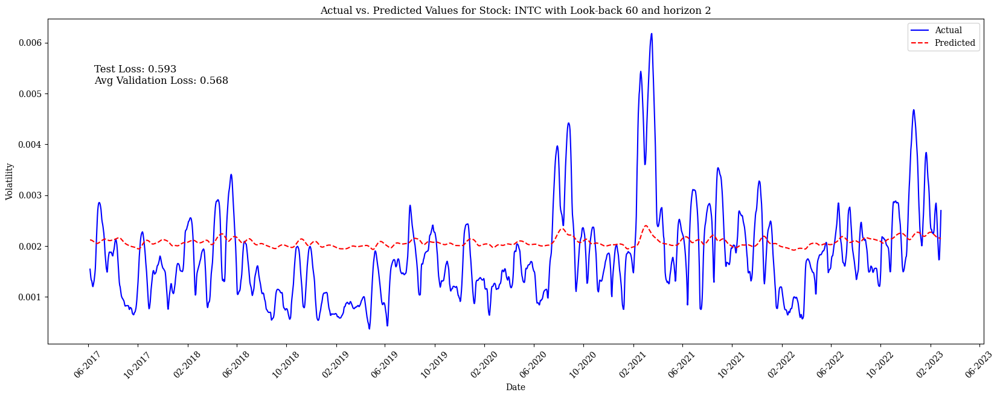

66/66 [==============================] - 3s 46ms/step - loss: 0.5928 - mae: 0.6145


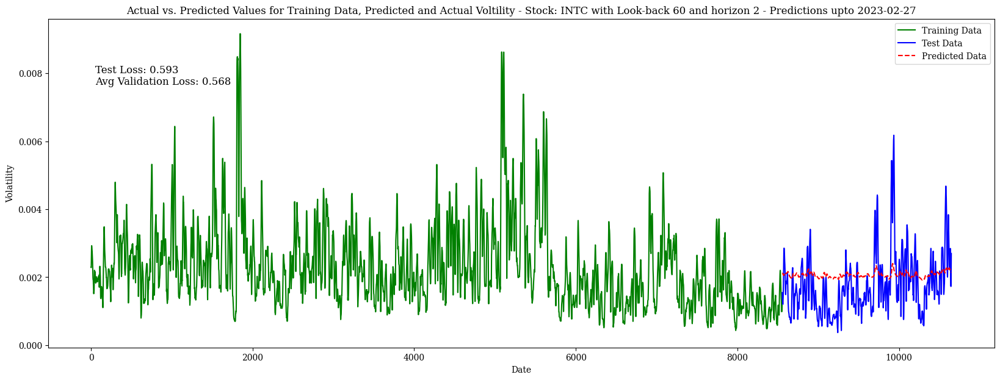


 Test Loss of 0.5927600860595703 with a look-back 60 and horizon 2

 Current Iteration: 
	 Look Back : 60 
	 Horizon : 3
Epoch 1/50
121/121 [==============================] - 29s 181ms/step - loss: 783.2621 - mae: 1.1259 - val_loss: 0.7662 - val_mae: 0.8042
Epoch 2/50
121/121 [==============================] - 21s 177ms/step - loss: 0.7508 - mae: 0.6360 - val_loss: 0.5410 - val_mae: 0.6617
Epoch 3/50
121/121 [==============================] - 22s 178ms/step - loss: 0.6024 - mae: 0.5743 - val_loss: 0.2869 - val_mae: 0.4537
Epoch 4/50
121/121 [==============================] - 21s 177ms/step - loss: 0.5581 - mae: 0.5474 - val_loss: 0.2518 - val_mae: 0.4185
Epoch 5/50
121/121 [==============================] - 22s 180ms/step - loss: 0.5058 - mae: 0.5138 - val_loss: 0.2484 - val_mae: 0.4128
Epoch 6/50
121/121 [==============================] - 22s 179ms/step - loss: 0.4311 - mae: 0.4698 - val_loss: 0.2174 - val_mae: 0.3851
Epoch 7/50
121/121 [==============================] - 22s 181ms/st

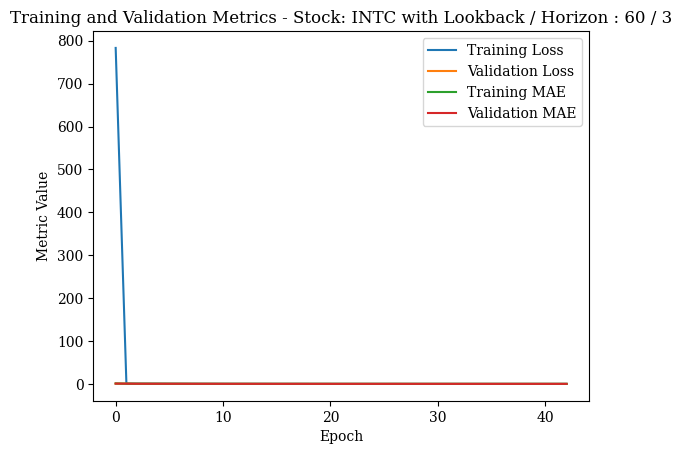

66/66 [==============================] - 3s 37ms/step - loss: 0.4671 - mae: 0.4892


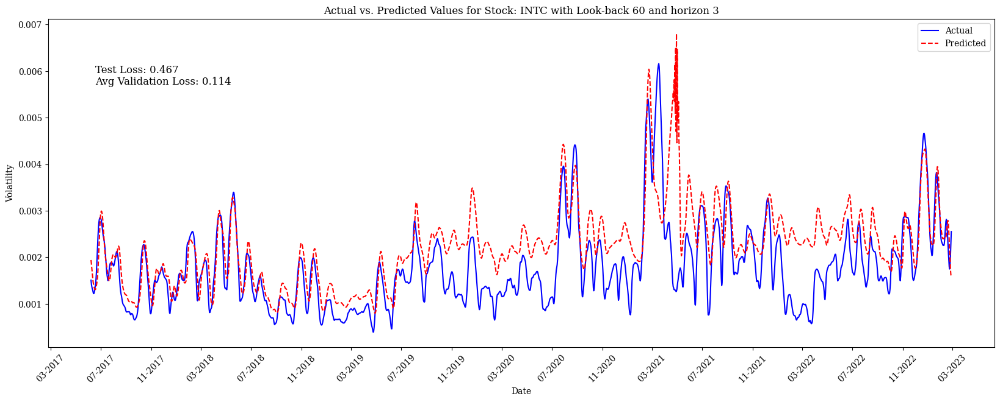

66/66 [==============================] - 3s 38ms/step - loss: 0.4671 - mae: 0.4892


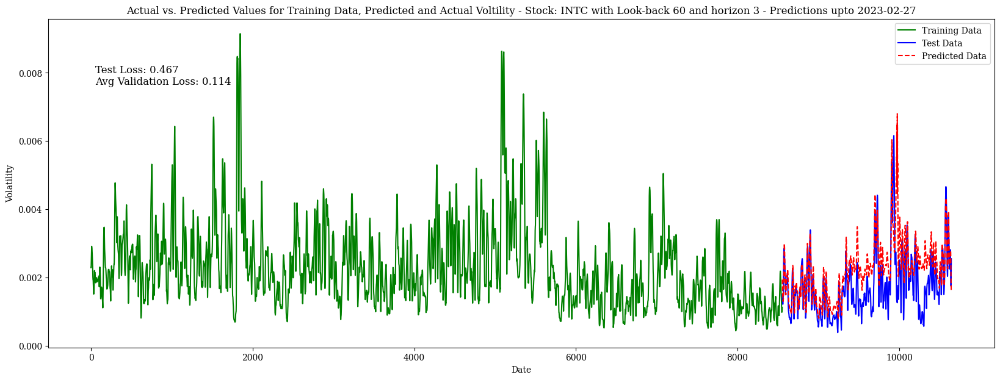


 Test Loss of 0.46712735295295715 with a look-back 60 and horizon 3

 Current Iteration: 
	 Look Back : 60 
	 Horizon : 4
Epoch 1/50
121/121 [==============================] - 30s 188ms/step - loss: 3319362816.0000 - mae: 2266.2795 - val_loss: 97.0601 - val_mae: 5.7799
Epoch 2/50
121/121 [==============================] - 22s 181ms/step - loss: 10.2465 - mae: 1.2377 - val_loss: 0.8319 - val_mae: 0.8464
Epoch 3/50
121/121 [==============================] - 22s 184ms/step - loss: 5.2714 - mae: 1.0239 - val_loss: 0.7914 - val_mae: 0.8242
Epoch 4/50
121/121 [==============================] - 22s 180ms/step - loss: 4.3792 - mae: 0.9290 - val_loss: 0.7579 - val_mae: 0.8052
Epoch 5/50
121/121 [==============================] - 22s 182ms/step - loss: 2.7990 - mae: 0.8682 - val_loss: 0.6871 - val_mae: 0.7625
Epoch 6/50
121/121 [==============================] - 22s 182ms/step - loss: 1.7380 - mae: 0.7970 - val_loss: 0.6099 - val_mae: 0.7137
Epoch 7/50
121/121 [==============================] -

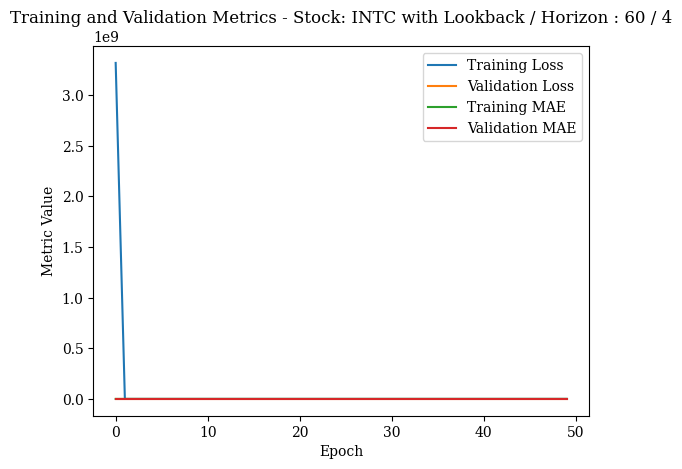

66/66 [==============================] - 3s 41ms/step - loss: 1.8861 - mae: 1.2079


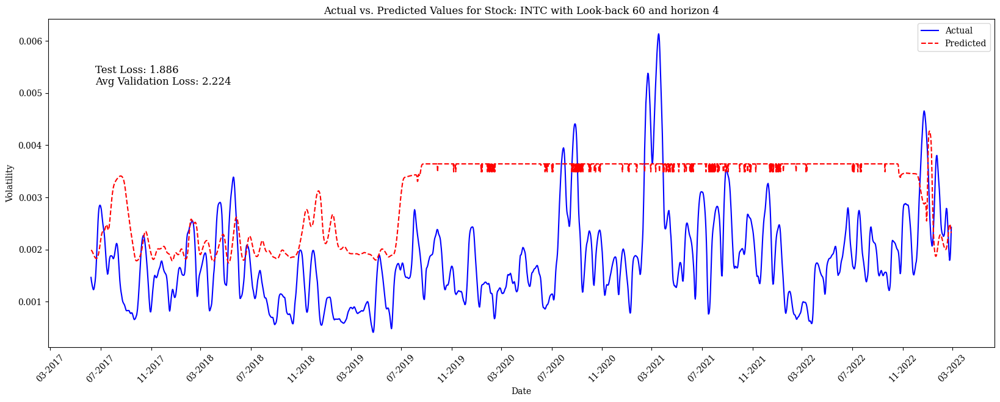

66/66 [==============================] - 3s 43ms/step - loss: 1.8861 - mae: 1.2079


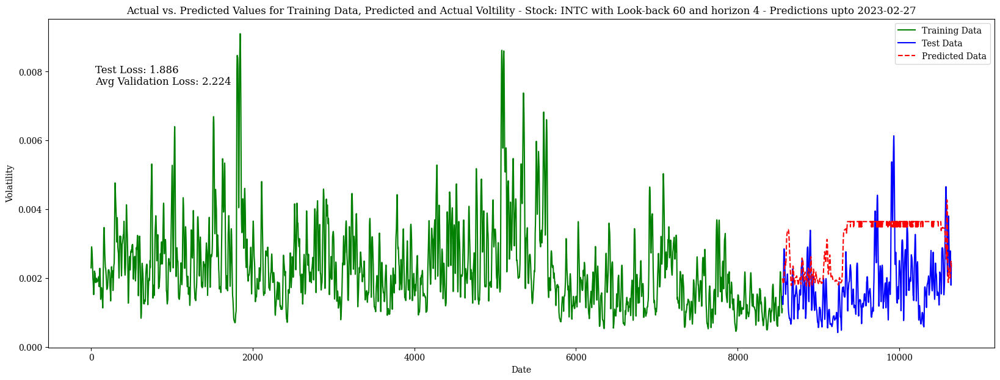


 Test Loss of 1.8860812187194824 with a look-back 60 and horizon 4

 Current Iteration: 
	 Look Back : 90 
	 Horizon : 1
Epoch 1/50
120/120 [==============================] - 37s 272ms/step - loss: 5888422.5000 - mae: 30.4060 - val_loss: 0.7597 - val_mae: 0.7979
Epoch 2/50
120/120 [==============================] - 29s 241ms/step - loss: 0.8725 - mae: 0.6721 - val_loss: 0.6992 - val_mae: 0.7642
Epoch 3/50
120/120 [==============================] - 31s 262ms/step - loss: 0.8130 - mae: 0.6635 - val_loss: 0.6519 - val_mae: 0.7357
Epoch 4/50
120/120 [==============================] - 29s 238ms/step - loss: 0.7900 - mae: 0.6562 - val_loss: 0.5967 - val_mae: 0.7006
Epoch 5/50
120/120 [==============================] - 31s 261ms/step - loss: 0.7626 - mae: 0.6419 - val_loss: 0.5223 - val_mae: 0.6504
Epoch 6/50
120/120 [==============================] - 29s 239ms/step - loss: 0.7285 - mae: 0.6261 - val_loss: 0.4344 - val_mae: 0.5851
Epoch 7/50
120/120 [==============================] - 30s 253

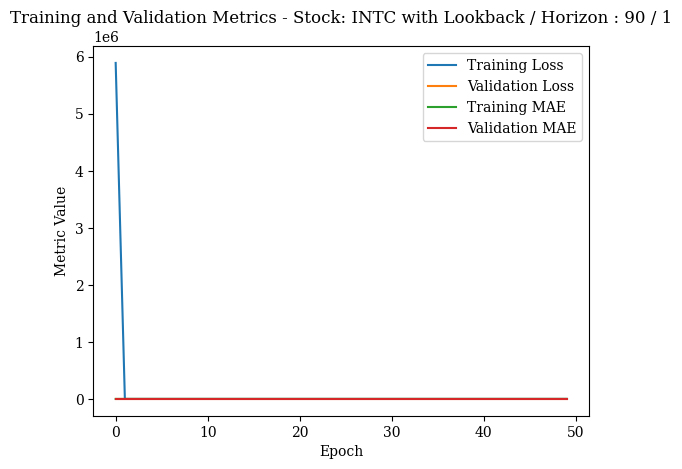

65/65 [==============================] - 4s 55ms/step - loss: 0.7170 - mae: 0.6969


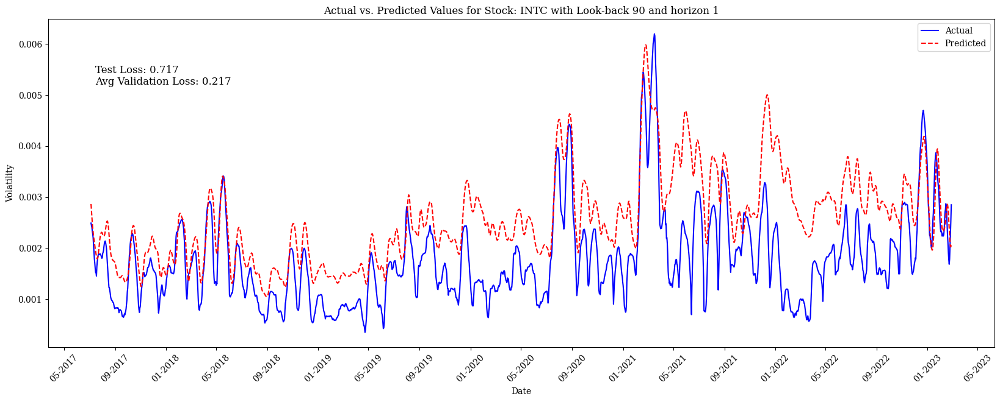

65/65 [==============================] - 4s 59ms/step - loss: 0.7170 - mae: 0.6969


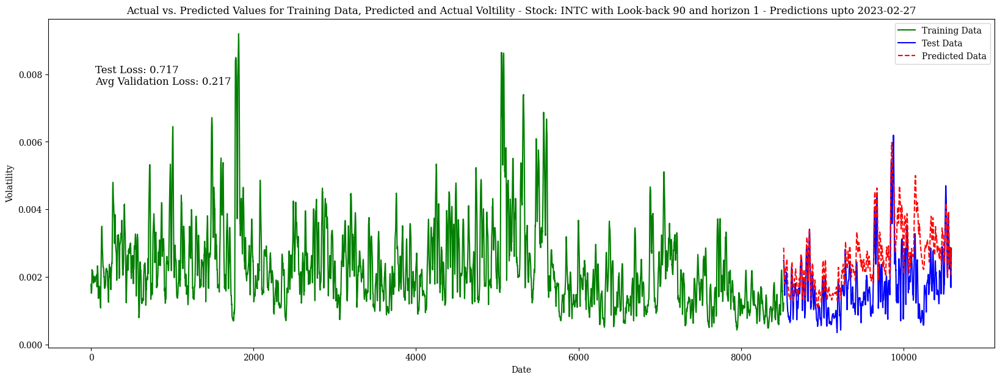


 Test Loss of 0.7170392274856567 with a look-back 90 and horizon 1

 Current Iteration: 
	 Look Back : 90 
	 Horizon : 2
Epoch 1/50
120/120 [==============================] - 42s 284ms/step - loss: 0.6502 - mae: 0.5122 - val_loss: 0.1520 - val_mae: 0.3251
Epoch 2/50
120/120 [==============================] - 31s 256ms/step - loss: 0.1347 - mae: 0.2727 - val_loss: 0.0532 - val_mae: 0.1862
Epoch 3/50
120/120 [==============================] - 30s 249ms/step - loss: 0.0824 - mae: 0.2114 - val_loss: 0.0381 - val_mae: 0.1597
Epoch 4/50
120/120 [==============================] - 31s 258ms/step - loss: 0.0591 - mae: 0.1777 - val_loss: 0.0262 - val_mae: 0.1312
Epoch 5/50
120/120 [==============================] - 31s 259ms/step - loss: 0.0479 - mae: 0.1603 - val_loss: 0.0155 - val_mae: 0.0890
Epoch 6/50
120/120 [==============================] - 30s 251ms/step - loss: 0.0410 - mae: 0.1458 - val_loss: 0.0117 - val_mae: 0.0781
Epoch 7/50
120/120 [==============================] - 32s 264ms/step

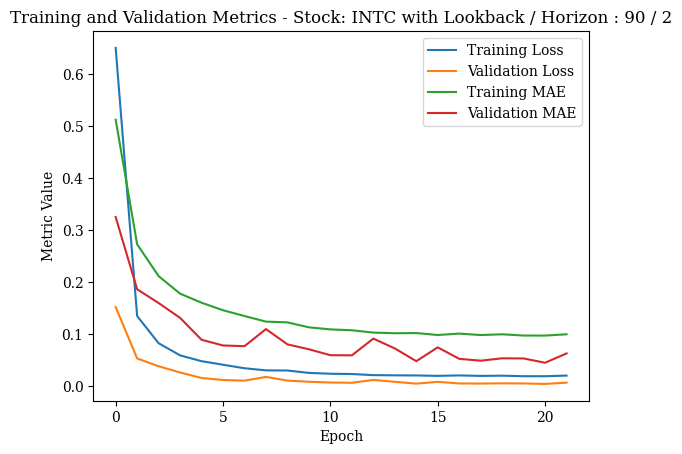

65/65 [==============================] - 4s 59ms/step - loss: 0.0118 - mae: 0.0765


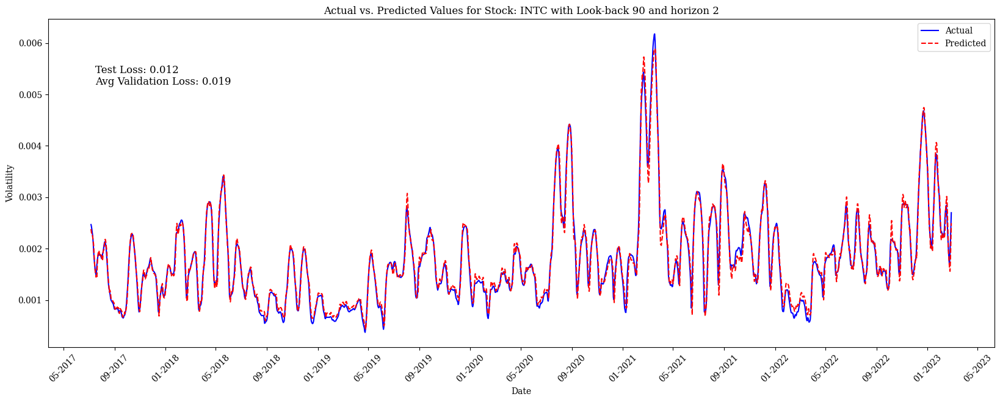

65/65 [==============================] - 4s 56ms/step - loss: 0.0118 - mae: 0.0765


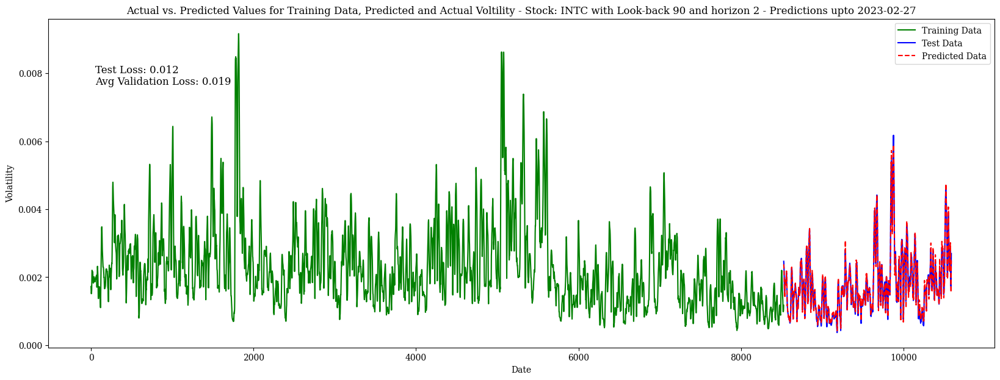


 Test Loss of 0.011766342446208 with a look-back 90 and horizon 2

 Current Iteration: 
	 Look Back : 90 
	 Horizon : 3
Epoch 1/50
120/120 [==============================] - 43s 304ms/step - loss: 5.1147 - mae: 0.6044 - val_loss: 0.2074 - val_mae: 0.3555
Epoch 2/50
120/120 [==============================] - 35s 291ms/step - loss: 0.3390 - mae: 0.4135 - val_loss: 0.0899 - val_mae: 0.2369
Epoch 3/50
120/120 [==============================] - 29s 242ms/step - loss: 0.2664 - mae: 0.3517 - val_loss: 0.0632 - val_mae: 0.1886
Epoch 4/50
120/120 [==============================] - 33s 271ms/step - loss: 0.1950 - mae: 0.3016 - val_loss: 0.0624 - val_mae: 0.1913
Epoch 5/50
120/120 [==============================] - 29s 244ms/step - loss: 0.1301 - mae: 0.2660 - val_loss: 0.0505 - val_mae: 0.1729
Epoch 6/50
120/120 [==============================] - 31s 260ms/step - loss: 0.1172 - mae: 0.2517 - val_loss: 0.0487 - val_mae: 0.1637
Epoch 7/50
120/120 [==============================] - 29s 239ms/step 

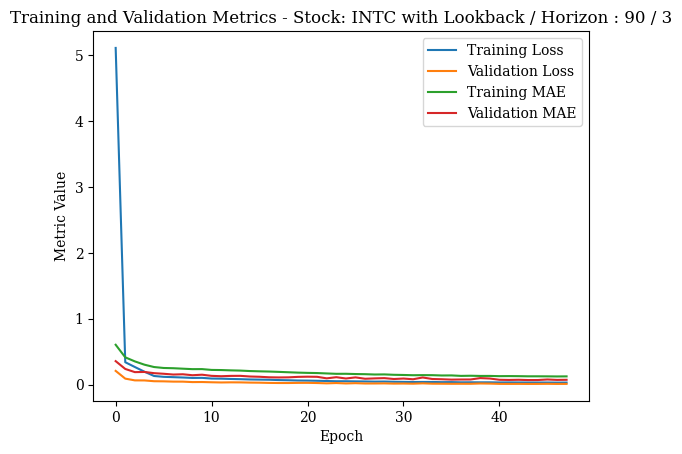

65/65 [==============================] - 4s 67ms/step - loss: 0.1113 - mae: 0.2381


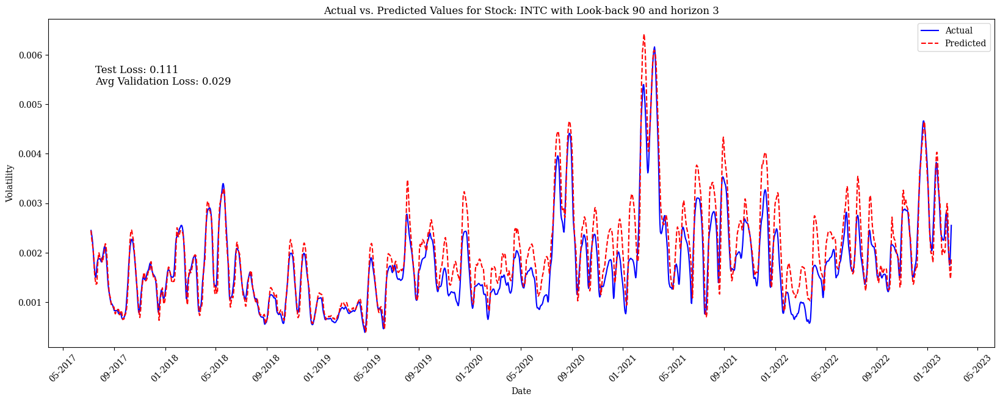

65/65 [==============================] - 4s 55ms/step - loss: 0.1113 - mae: 0.2381


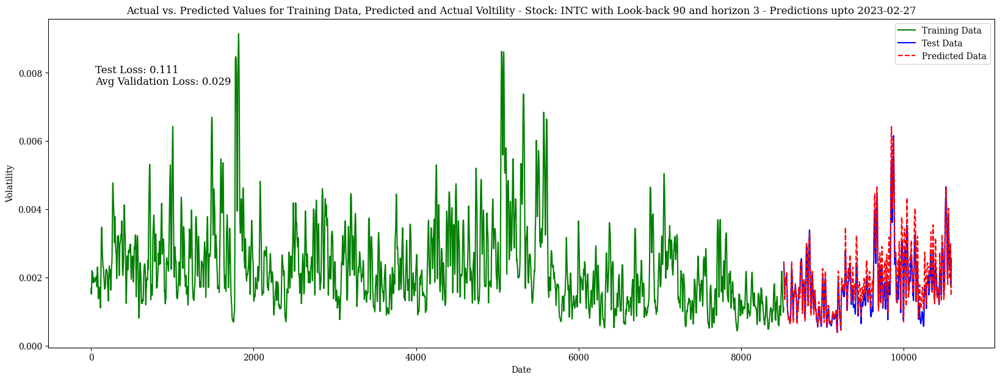


 Test Loss of 0.11134302616119385 with a look-back 90 and horizon 3

 Current Iteration: 
	 Look Back : 90 
	 Horizon : 4
Epoch 1/50
120/120 [==============================] - 45s 303ms/step - loss: 20372717568.0000 - mae: 5226.0049 - val_loss: 0.7755 - val_mae: 0.8006
Epoch 2/50
120/120 [==============================] - 32s 262ms/step - loss: 226216.0000 - mae: 28.0729 - val_loss: 0.7753 - val_mae: 0.8006
Epoch 3/50
120/120 [==============================] - 31s 262ms/step - loss: 428895.1875 - mae: 43.2447 - val_loss: 0.7765 - val_mae: 0.8012
Epoch 4/50
120/120 [==============================] - 30s 253ms/step - loss: 532889.6250 - mae: 43.5392 - val_loss: 0.7799 - val_mae: 0.8030
Epoch 5/50
120/120 [==============================] - 32s 271ms/step - loss: 442666.0625 - mae: 40.0641 - val_loss: 0.7816 - val_mae: 0.8038
Epoch 6/50
120/120 [==============================] - 30s 253ms/step - loss: 618596.9375 - mae: 47.2705 - val_loss: 0.7850 - val_mae: 0.8055
Epoch 7/50
120/120 [====

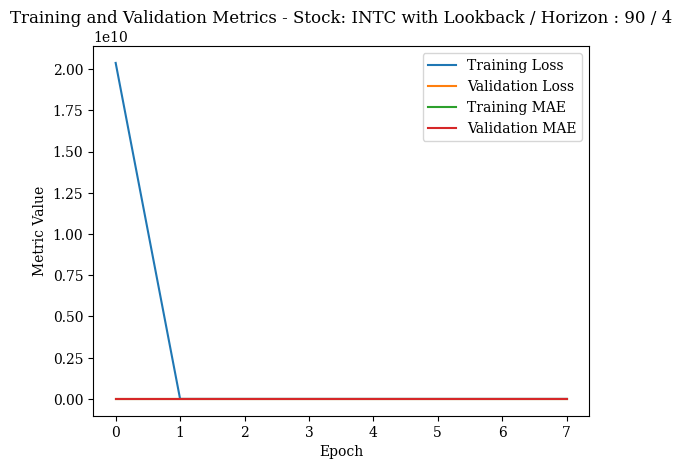

65/65 [==============================] - 4s 57ms/step - loss: 27.7463 - mae: 1.7221


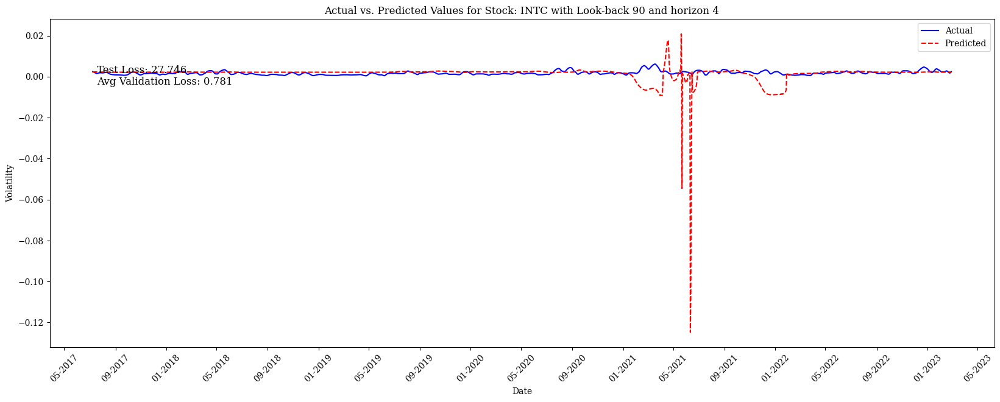

65/65 [==============================] - 4s 63ms/step - loss: 27.7463 - mae: 1.7221


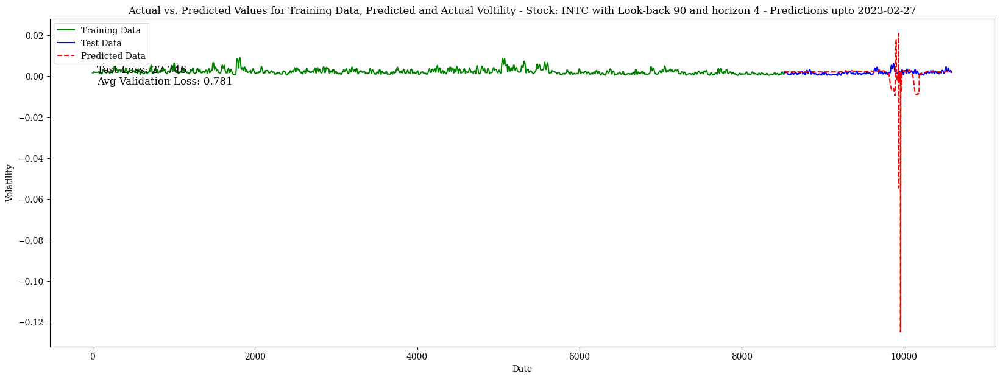


 Test Loss of 27.746305465698242 with a look-back 90 and horizon 4


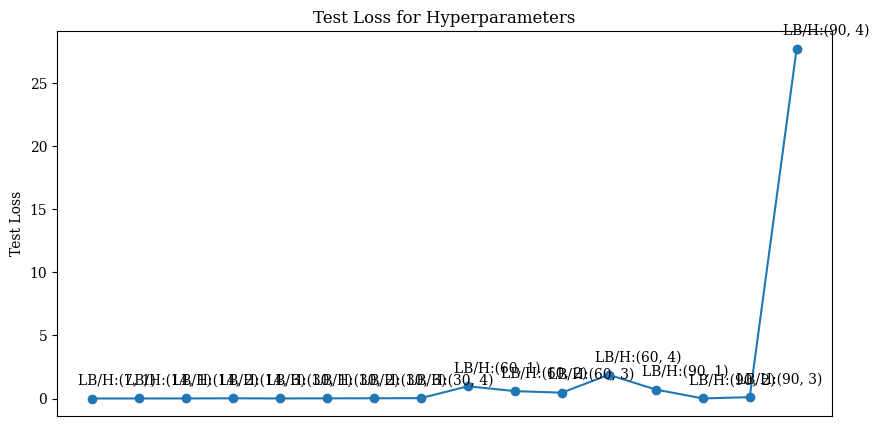

In [22]:
best_lb_h, best_loss = determine_best_hyperparameters(df_scaled)
best_look_back, best_horizon = best_lb_h

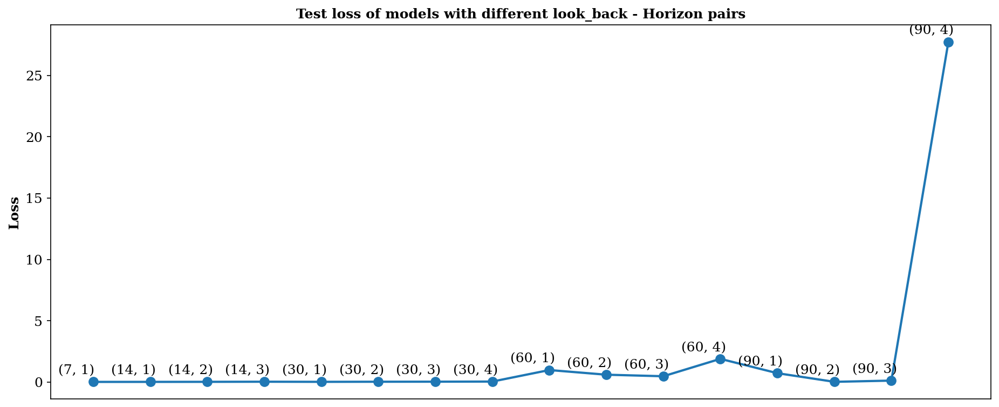

In [54]:
def plot_loss_vs_lb_ho(lb_ho, losses):
    """
    Plots a line plot for the best loss values for different look_back-Horizon pairs

    Parameters:
    lb_ho (list): A list of tuples containing look_back and Horizon values
    losses (list): A list of corresponding loss values for each look_back-Horizon pair

    Returns:
    None
    """

    # Setting figure size and dpi
    plt.figure(figsize=(15,6), dpi=150)

    # Plotting the loss values
    plt.plot(losses, 'o-', linewidth=2, markersize=8)

    # Annotating (lb, ho) values over the corresponding loss points
    for i, loss in enumerate(losses):
        lb, ho = lb_ho[i]
        plt.annotate('({}, {})'.format(lb, ho), xy=(i, loss), xytext=(-15, 10),
                     textcoords='offset points', ha='center', va='center', fontsize = 12)

    # Adding plot title and labels
    plt.title('Test loss of models with different look_back - Horizon pairs', fontsize = 12, fontweight = 'bold')
    plt.ylabel('Loss', fontsize=12, fontweight = 'bold')
    plt.xticks([])
    plt.yticks(fontsize=12)
    plt.show()




test_losses = list(test_losses)

plot_loss_vs_lb_ho(hyperparameters, test_losses)


In [23]:
print("\nBest Look back: ", best_look_back)
print("Best Horizon: ", best_horizon)
print(f"\n After all iterations, Best Test Loss of {best_loss} is found with a look-back {best_look_back} and horizon {best_horizon}")


Best Look back:  7
Best Horizon:  1

 After all iterations, Best Test Loss of 0.005828014109283686 is found with a look-back 7 and horizon 1


In [24]:
# Define LSTM model with default values for the hyperparameters
def create_lstm_model2(n_neurons = 64, look_back = best_look_back, horizon = best_horizon, dropout_rate = 0.1, optimizer = 'adam', learning_rate = 0.0001):
    """
    Creates an LSTM model - This is an identical model just like the earlier ones.
    This is dedicated to do hyperparameter tuning.

    Parameters:
    n_neurons (int): number of neurons in the LSTM layer
    look_back (int): number of time steps to look back for creating the input sequence
    horizon (int): number of time steps to predict into the future
    dropout_rate (float): dropout rate for regularization
    optimizer (str): optimizer to use for training
    learning_rate (float): learning rate for the optimizer

    Returns:
    model : compiled LSTM model
    """
 
    model = Sequential()
    model.add(LSTM(n_neurons, input_shape=(look_back, 7), return_sequences=True, activation='elu')) # 7 indicates number of input features
    model.add(Dropout(dropout_rate))
    model.add(LSTM(n_neurons//2, return_sequences=True, activation='elu'))
    model.add(Dropout(dropout_rate))
    model.add(LSTM(n_neurons//4, activation='elu'))
    model.add(Dense(horizon))
    model.add(Activation('linear'))

    # set optimizer
    if optimizer == 'adam':
        opt = Adam(learning_rate=learning_rate)
    elif optimizer == 'rmsprop':
        opt = RMSprop(learning_rate=learning_rate)
    elif optimizer == 'adagrad':
        opt = Adagrad(learning_rate=learning_rate)
    elif optimizer == 'adadelta':
        opt = Adadelta(learning_rate=learning_rate)
    elif optimizer == 'sgd':
        opt = SGD(learning_rate=learning_rate)
    else:
        raise ValueError('Invalid optimizer specified')
    
    model.compile(optimizer = opt, loss='mse', metrics=['mae'])    
    return model


# Split the dataset into training and test sets
train_data, test_data = train_test_split(df_scaled, test_size = 0.2, shuffle = False)

# create train and test data
X_train, y_train = create_input_output_pairs(train_data.values, look_back = best_look_back, horizon = best_horizon)

# Create an instance of the KerasRegressor wrapper class for our LSTM model
model = KerasRegressor(build_fn = create_lstm_model2, verbose = 0)

# Define the hyperparameters to test
# n_neurons = [32]
# dropout_rate = [0.05]
# learning_rate = [0.0001, 0.001]
n_neurons = [32, 64, 128]
dropout_rate = [0.05, 0.1, 0.2]
learning_rate = [0.0001, 0.001, 0.01]

param_grid = dict(n_neurons = n_neurons, dropout_rate = dropout_rate, learning_rate = learning_rate)

# Define time series split for cross-validation
tscv = TimeSeriesSplit(n_splits=5)

# Perform grid search to find the best hyperparameters for our LSTM model
grid = GridSearchCV(estimator = model, param_grid = param_grid, cv = tscv, verbose = 1, n_jobs = -1)
grid_result = grid.fit(X_train, y_train)



Fitting 5 folds for each of 27 candidates, totalling 135 fits


<ipython-input-24-8f01d8fb36de>:53: DeprecationWarning: KerasRegressor is deprecated, use Sci-Keras (https://github.com/adriangb/scikeras) instead. See https://www.adriangb.com/scikeras/stable/migration.html for help migrating.
  model = KerasRegressor(build_fn = create_lstm_model2, verbose = 0)


In [25]:
# Print the best hyperparameters and corresponding mean test score
print("Best: %f using %s" % (grid_result.best_score_, grid_result.best_params_))
means = grid_result.cv_results_['mean_test_score']
stds = grid_result.cv_results_['std_test_score']
params = grid_result.cv_results_['params']
for mean, stdev, param in zip(means, stds, params):
    print("%f (%f) with: %r" % (mean, stdev, param))

# Store the best hyperparameters separately
best_params = grid_result.best_params_
n_neurons_best = best_params['n_neurons']
dropout_rate_best = best_params['dropout_rate']
learning_rate_best = best_params['learning_rate']

Best: -0.102260 using {'dropout_rate': 0.05, 'learning_rate': 0.01, 'n_neurons': 128}
-0.943802 (0.568962) with: {'dropout_rate': 0.05, 'learning_rate': 0.0001, 'n_neurons': 32}
-0.804502 (0.491088) with: {'dropout_rate': 0.05, 'learning_rate': 0.0001, 'n_neurons': 64}
-0.586241 (0.429409) with: {'dropout_rate': 0.05, 'learning_rate': 0.0001, 'n_neurons': 128}
-0.435807 (0.355132) with: {'dropout_rate': 0.05, 'learning_rate': 0.001, 'n_neurons': 32}
-0.340520 (0.259835) with: {'dropout_rate': 0.05, 'learning_rate': 0.001, 'n_neurons': 64}
-0.244680 (0.191443) with: {'dropout_rate': 0.05, 'learning_rate': 0.001, 'n_neurons': 128}
-0.208775 (0.312175) with: {'dropout_rate': 0.05, 'learning_rate': 0.01, 'n_neurons': 32}
-0.199390 (0.203621) with: {'dropout_rate': 0.05, 'learning_rate': 0.01, 'n_neurons': 64}
-0.102260 (0.080699) with: {'dropout_rate': 0.05, 'learning_rate': 0.01, 'n_neurons': 128}
-1.016369 (0.670202) with: {'dropout_rate': 0.1, 'learning_rate': 0.0001, 'n_neurons': 32}
-

In [26]:
best_params

{'dropout_rate': 0.05, 'learning_rate': 0.01, 'n_neurons': 128}

Epoch 1/100
26/26 [==============================] - 6s 60ms/step - loss: 0.3779 - mae: 0.4352 - val_loss: 0.2120 - val_mae: 0.3703
Epoch 2/100
26/26 [==============================] - 1s 39ms/step - loss: 0.1059 - mae: 0.2392 - val_loss: 0.0320 - val_mae: 0.1498
Epoch 3/100
26/26 [==============================] - 1s 38ms/step - loss: 0.0333 - mae: 0.1336 - val_loss: 0.0198 - val_mae: 0.1117
Epoch 4/100
26/26 [==============================] - 2s 62ms/step - loss: 0.0209 - mae: 0.1077 - val_loss: 0.0138 - val_mae: 0.0895
Epoch 5/100
26/26 [==============================] - 2s 69ms/step - loss: 0.0105 - mae: 0.0756 - val_loss: 0.0077 - val_mae: 0.0677
Epoch 6/100
26/26 [==============================] - 2s 69ms/step - loss: 0.0103 - mae: 0.0734 - val_loss: 0.0068 - val_mae: 0.0661
Epoch 7/100
26/26 [==============================] - 2s 67ms/step - loss: 0.0066 - mae: 0.0606 - val_loss: 0.0068 - val_mae: 0.0668
Epoch 8/100
26/26 [==============================] - 1s 38ms/step - loss: 0.

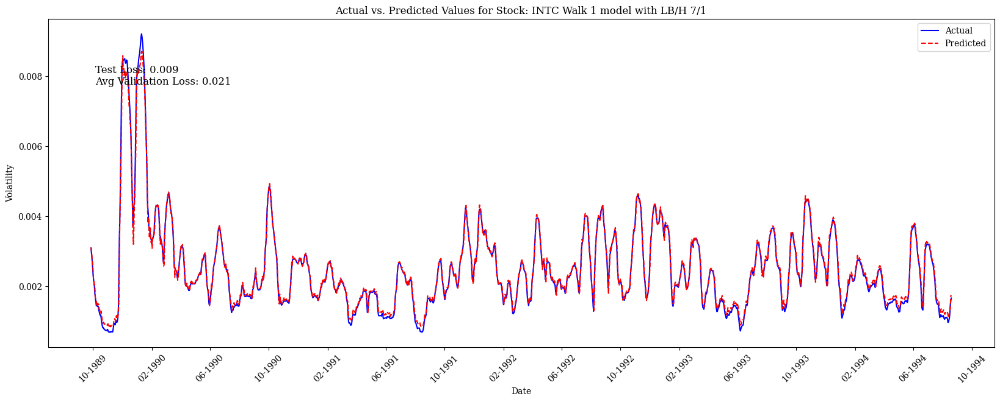

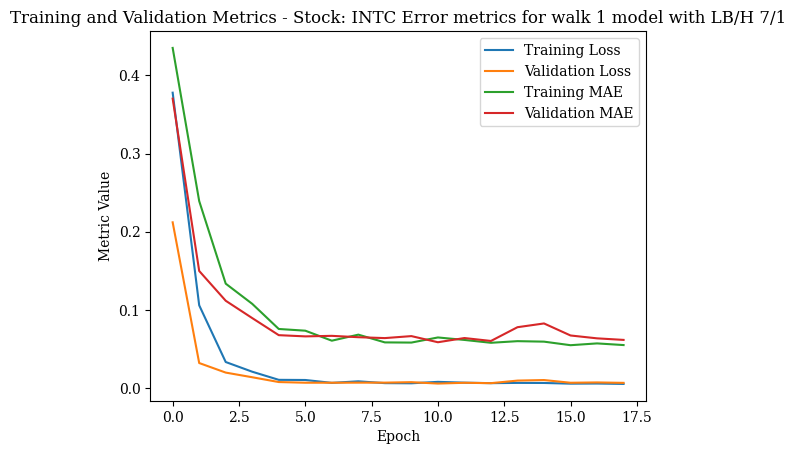

56/56 [==============================] - 1s 10ms/step
walk 1: Test Loss = 0.0094, RMSE = 0.00, R squared = 0.99
Epoch 1/100
51/51 [==============================] - 9s 53ms/step - loss: 0.4894 - mae: 0.4364 - val_loss: 0.1278 - val_mae: 0.2809
Epoch 2/100
51/51 [==============================] - 2s 41ms/step - loss: 0.0704 - mae: 0.1845 - val_loss: 0.0216 - val_mae: 0.1056
Epoch 3/100
51/51 [==============================] - 2s 42ms/step - loss: 0.0287 - mae: 0.1243 - val_loss: 0.0223 - val_mae: 0.1260
Epoch 4/100
51/51 [==============================] - 2s 42ms/step - loss: 0.0227 - mae: 0.1109 - val_loss: 0.0223 - val_mae: 0.1275
Epoch 5/100
51/51 [==============================] - 3s 60ms/step - loss: 0.0138 - mae: 0.0854 - val_loss: 0.0063 - val_mae: 0.0578
Epoch 6/100
51/51 [==============================] - 4s 72ms/step - loss: 0.0137 - mae: 0.0846 - val_loss: 0.0123 - val_mae: 0.0963
Epoch 7/100
51/51 [==============================] - 3s 53ms/step - loss: 0.0147 - mae: 0.0873 -

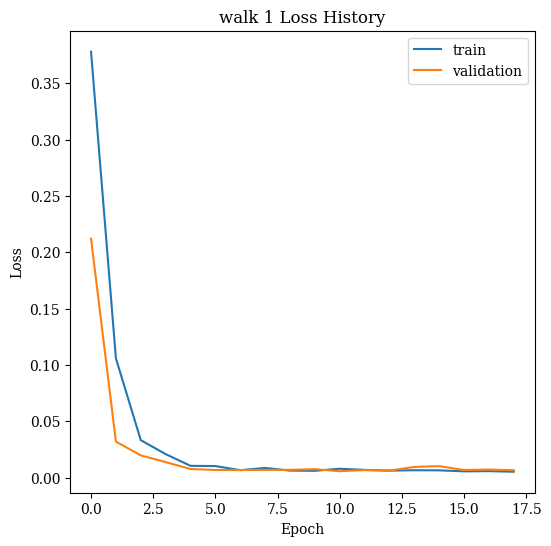

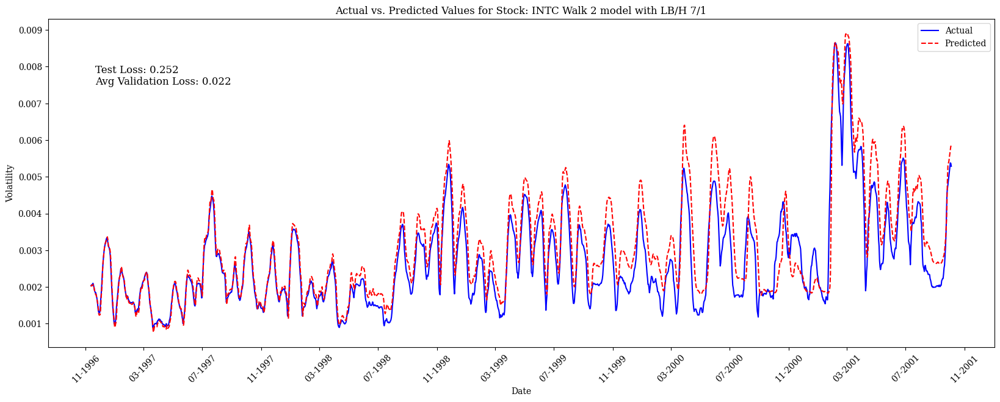

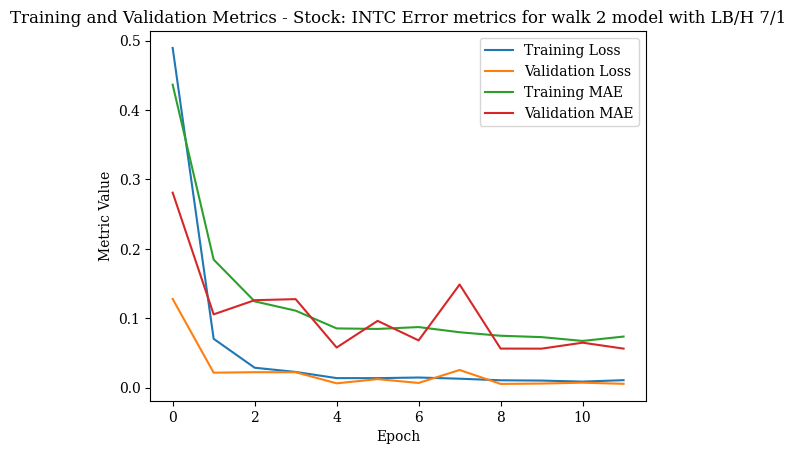

56/56 [==============================] - 1s 11ms/step
walk 2: Test Loss = 0.2521, RMSE = 0.00, R squared = 0.80
Epoch 1/100
76/76 [==============================] - 8s 49ms/step - loss: 0.2129 - mae: 0.2898 - val_loss: 0.1485 - val_mae: 0.2787
Epoch 2/100
76/76 [==============================] - 5s 71ms/step - loss: 0.0205 - mae: 0.0998 - val_loss: 0.0596 - val_mae: 0.1758
Epoch 3/100
76/76 [==============================] - 4s 56ms/step - loss: 0.0100 - mae: 0.0715 - val_loss: 0.0276 - val_mae: 0.1156
Epoch 4/100
76/76 [==============================] - 3s 42ms/step - loss: 0.0088 - mae: 0.0671 - val_loss: 0.0261 - val_mae: 0.1167
Epoch 5/100
76/76 [==============================] - 3s 42ms/step - loss: 0.0083 - mae: 0.0660 - val_loss: 0.0210 - val_mae: 0.1047
Epoch 6/100
76/76 [==============================] - 4s 54ms/step - loss: 0.0092 - mae: 0.0685 - val_loss: 0.0500 - val_mae: 0.1725
Epoch 7/100
76/76 [==============================] - 6s 73ms/step - loss: 0.0084 - mae: 0.0650 -

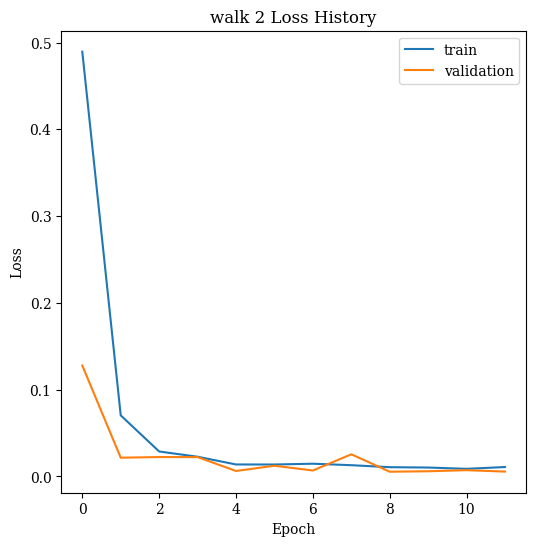

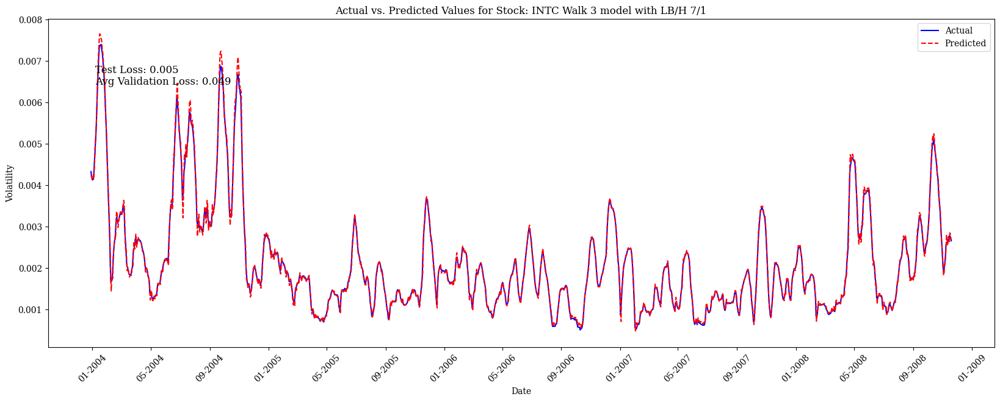

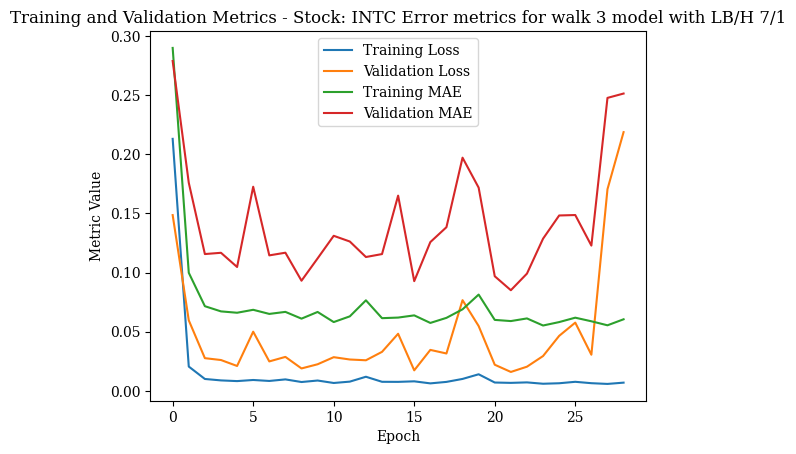

56/56 [==============================] - 1s 11ms/step
walk 3: Test Loss = 0.0049, RMSE = 0.00, R squared = 1.00
Epoch 1/100
101/101 [==============================] - 13s 77ms/step - loss: 0.3076 - mae: 0.3563 - val_loss: 0.0168 - val_mae: 0.0957
Epoch 2/100
101/101 [==============================] - 5s 49ms/step - loss: 0.0234 - mae: 0.1073 - val_loss: 0.0053 - val_mae: 0.0524
Epoch 3/100
101/101 [==============================] - 5s 45ms/step - loss: 0.0124 - mae: 0.0795 - val_loss: 0.0042 - val_mae: 0.0482
Epoch 4/100
101/101 [==============================] - 6s 58ms/step - loss: 0.0112 - mae: 0.0754 - val_loss: 0.0074 - val_mae: 0.0699
Epoch 5/100
101/101 [==============================] - 6s 62ms/step - loss: 0.0119 - mae: 0.0747 - val_loss: 0.0042 - val_mae: 0.0479
Epoch 6/100
101/101 [==============================] - 4s 43ms/step - loss: 0.0108 - mae: 0.0729 - val_loss: 0.0052 - val_mae: 0.0576
Epoch 7/100
101/101 [==============================] - 4s 43ms/step - loss: 0.0101 

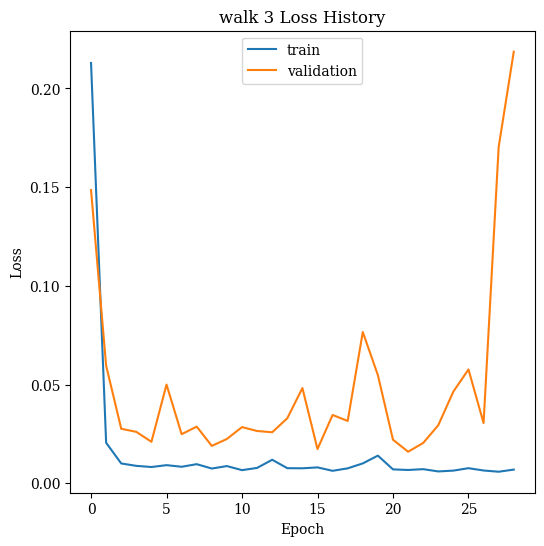

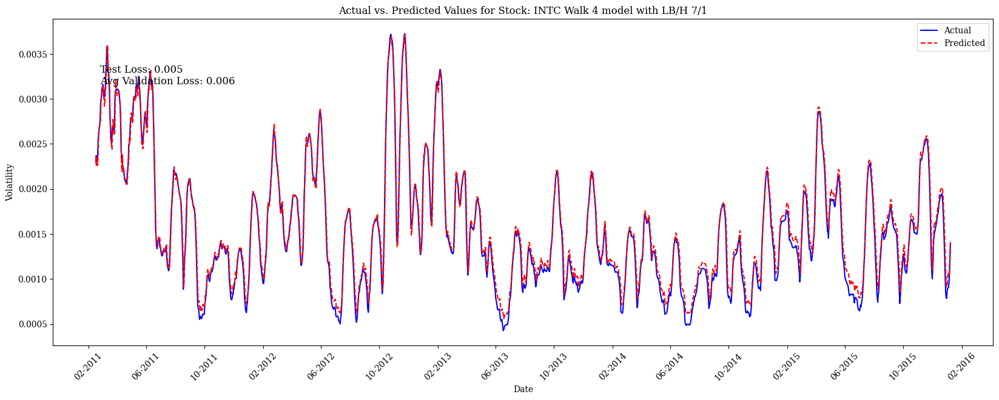

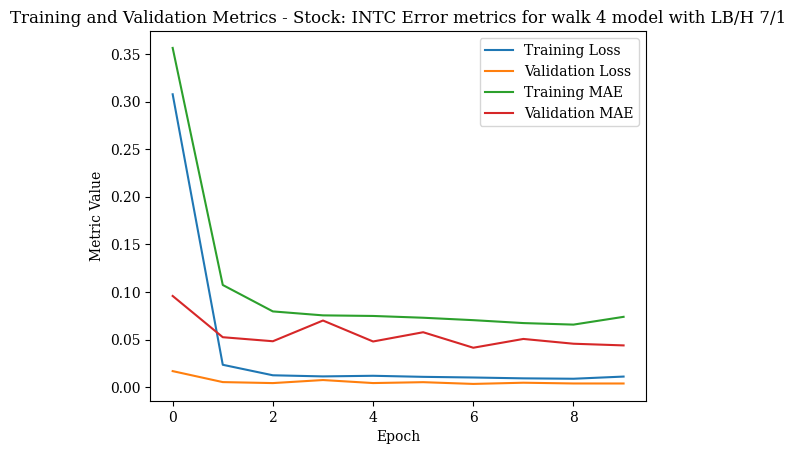

56/56 [==============================] - 1s 15ms/step
walk 4: Test Loss = 0.0050, RMSE = 0.00, R squared = 0.99
Epoch 1/100
127/127 [==============================] - 11s 52ms/step - loss: 0.1470 - mae: 0.2366 - val_loss: 0.0436 - val_mae: 0.1894
Epoch 2/100
127/127 [==============================] - 9s 67ms/step - loss: 0.0145 - mae: 0.0830 - val_loss: 0.0114 - val_mae: 0.0950
Epoch 3/100
127/127 [==============================] - 6s 45ms/step - loss: 0.0104 - mae: 0.0711 - val_loss: 0.0019 - val_mae: 0.0335
Epoch 4/100
127/127 [==============================] - 7s 54ms/step - loss: 0.0088 - mae: 0.0662 - val_loss: 0.0056 - val_mae: 0.0624
Epoch 5/100
127/127 [==============================] - 8s 64ms/step - loss: 0.0111 - mae: 0.0732 - val_loss: 0.0043 - val_mae: 0.0566
Epoch 6/100
127/127 [==============================] - 6s 45ms/step - loss: 0.0090 - mae: 0.0671 - val_loss: 0.0030 - val_mae: 0.0445
Epoch 7/100
127/127 [==============================] - 8s 61ms/step - loss: 0.0077 

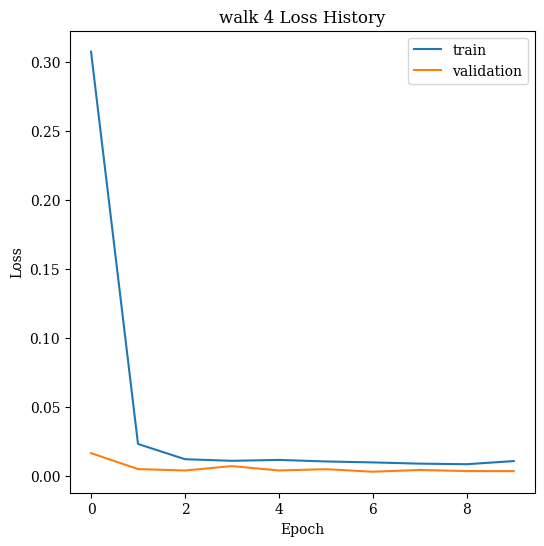

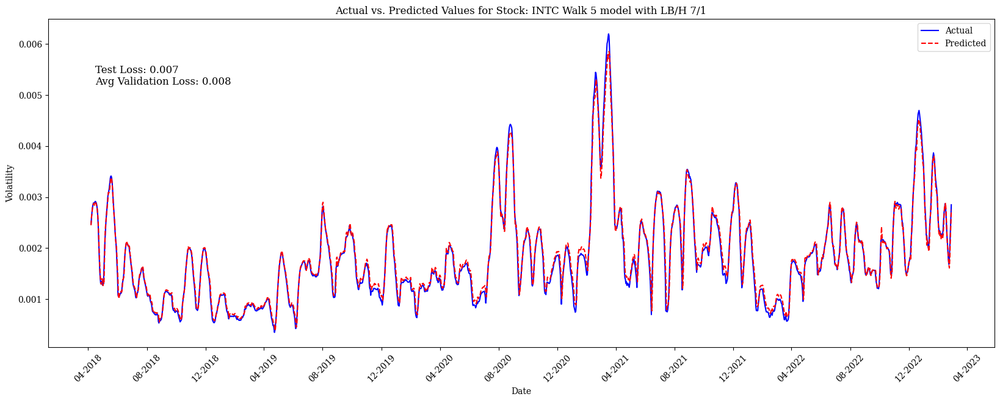

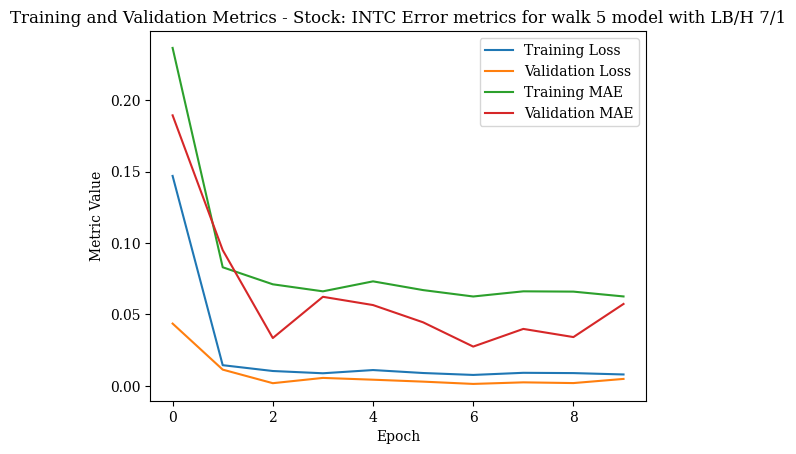

56/56 [==============================] - 1s 12ms/step
walk 5: Test Loss = 0.0069, RMSE = 0.00, R squared = 0.99
walk 4: Walk 5 validation loss = 0.0074


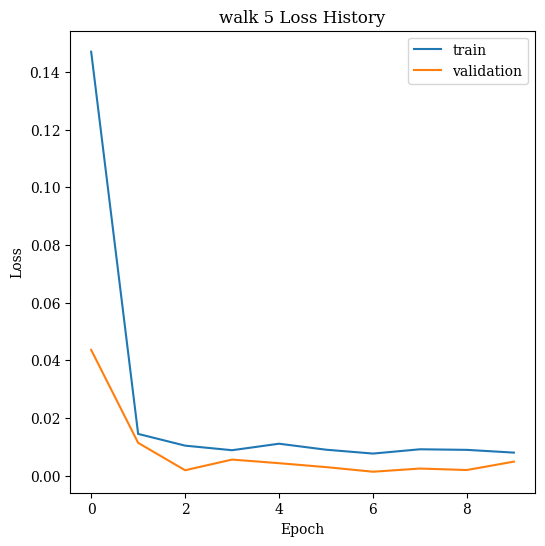

In [27]:

# assigning parameters for the model
look_back = best_look_back
horizon = best_horizon
n_neurons = n_neurons_best
n_epoch = 100
n_batch = 64
dropout_rate = dropout_rate_best
learning_rate = learning_rate_best


# define global variables - Evaluation metrics

# create empty lists to store validation and test losses for each walk
val_loss_list = []
test_loss_list = []

# create empty lists to store rmse, r-squared
walk_rmse = []
walk_r_squared = []

# define time series split
tscv = TimeSeriesSplit(n_splits=5)

# define empty dictionary
results_dict = {}

# to save best walk model and walk_5 model
best_model = None
walk_5_model = None

# Implementation of Walk-forward optimization using rolling time series cross validation
# Explanation and references are detailed in the report

# loop over different walks
for walk, (train_index, test_index) in enumerate(tscv.split(df_scaled)):
    # get actual start and end dates from df
    start_date = df.index[train_index[0]]
    end_date = df.index[test_index[-1]]

    # split data into train and test sets
    train_data = df_scaled.iloc[train_index, :]
    test_data = df_scaled.iloc[test_index, :]

    # create input-output pairs for train and test sets
    X_train, y_train = create_input_output_pairs(train_data.values, look_back, horizon)
    X_test, y_test = create_input_output_pairs(test_data.values, look_back, horizon)
    

    # train LSTM with early stopping
    model, history = create_lstm_model(
        X_train = X_train, 
        y_train = y_train,
        n_neurons = n_neurons, 
        num_steps_in = look_back, 
        num_steps_out = horizon, 
        features_n = df.shape[1], 
        learning_rate = learning_rate, 
        n_epoch = n_epoch, 
        n_batch = n_batch,
        dropout_rate = dropout_rate,
        optimizer = 'adam'
        )

    # evaluate model on Validation set  
    val_loss, val_mae  = loss_evaluation(X_train, y_train)
    val_loss_list.append(val_loss)

    # evaluate model on test set
    test_loss, test_mae  = loss_evaluation(X_test, y_test)
    test_loss_list.append(test_loss)

    end_date = df_scaled.index[test_index[-1]]
    # Plot actual vs. predicted values for test set
    plot_predictions(model, history, X_test, y_test, f"Stock: {stock_name} Walk {walk + 1} model with LB/H {look_back}/{horizon}", end_date)

    # plot metrics for these walks
    plot_metrics(history, f"Stock: {stock_name} Error metrics for walk {walk + 1} model with LB/H {look_back}/{horizon}")

    y_pred = model.predict(X_test)

    y_test_avg = np.mean(y_test, axis=1)
    y_pred_avg = np.mean(y_pred, axis=1)
    y_train_avg = np.mean(y_train, axis=1)

    # Calculate root mean squared error
    rmse = mean_squared_error(denormalize_ftn(y_test), denormalize_ftn(y_pred), squared=False)

    # Calculate R squared
    r_squared = r2_score(denormalize_ftn(y_test), denormalize_ftn(y_pred))

    # add rmse and r_squared to lists
    walk_rmse.append(rmse)
    walk_r_squared.append(r_squared)

    # print rmse and r_squared of current walk model
    print(f"walk {walk+1}: Test Loss = {test_loss:.4f}, RMSE = {rmse:.2f}, R squared = {r_squared:.2f}")


    # save model if it has the lowest test loss
    if walk == 0 or test_loss < results_dict.get("test_loss_best", float("inf")):
        results_dict["best_val_loss"] = val_loss
        results_dict["best_model"] = model
        results_dict["best_walk"] = walk
        results_dict["y_pred_best"] = y_pred_avg
        results_dict["X_train_best"] = X_train
        results_dict["y_train_best"] = y_train_avg
        results_dict["X_test_best"] = X_test
        results_dict["y_test_best"] = y_test_avg
        results_dict["RMSE_best"] = round(rmse,6)
        results_dict["test_loss_best"] = test_loss
        results_dict["test_mae_best"] = test_mae
        results_dict["val_loss_best"] = val_loss
        results_dict["val_mae_best"] = val_mae
        
        # save the best model
        best_model = results_dict["best_model"]
        best_model.save("best_model.h5")
    
    # save all model results
    results_dict[f"walk_{walk + 1}_val_loss"] = val_loss
    results_dict[f"walk_{walk + 1}_model"] = model
    results_dict[f"walk_{walk + 1}"] = walk
    results_dict[f"y_pred_walk_{walk + 1}"] = y_pred_avg
    results_dict[f"X_train_walk_{walk + 1}"] = X_train
    results_dict[f"y_train_walk_{walk + 1}"] = y_train_avg
    results_dict[f"X_test_walk_{walk + 1}"] = X_test
    results_dict[f"y_test_walk_{walk + 1}"] = y_test_avg
    results_dict[f"RMSE_walk_{walk + 1}"] = round(rmse,6)
    results_dict[f"test_loss_walk_{walk + 1}"] = test_loss
    results_dict[f"test_mae_walk_{walk + 1}"] = test_mae
    results_dict[f"val_loss_walk_{walk + 1}"] = val_loss
    results_dict[f"val_mae_walk_{walk + 1}"] = val_mae
    
    # save walk 5 model
    if walk == 4:
        walk_5_model = results_dict["walk_5_model"]
        walk_5_model.save("walk_5_model.h5")
        print(f"walk {results_dict['walk_5']}: Walk 5 validation loss = {results_dict['val_loss_walk_5']:.4f}")

    # plot loss history for this walk
    plt.figure(figsize=(6, 6), dpi = 100)
    plt.plot(history.history['loss'], label='train')
    plt.plot(history.history['val_loss'], label='validation')
    plt.title(f"walk {walk+1} Loss History")
    plt.xlabel('Epoch')
    plt.ylabel('Loss')
    plt.legend()


In [28]:
# calculate the average validation and test losses for all walks
avg_val_loss = sum(val_loss_list) / len(val_loss_list)
avg_test_loss = sum(test_loss_list) / len(test_loss_list)

print(f"Avg Validation Loss Across All walks: {avg_val_loss:.4f}")
print(f"Avg Test Loss Across All walks: {avg_test_loss:.4f}")

Avg Validation Loss Across All walks: 0.0076
Avg Test Loss Across All walks: 0.0557


In [29]:
#Print the accuracy and loss of each walk
for i in range(len(val_loss_list)):
  print(f"walk {i+1} -- Validation Loss: {val_loss_list[i]:.4f} -- Test Loss: {test_loss_list[i]:.4f}")

print(f'Best Test Loss: {results_dict["test_loss_best"]} at Walk {results_dict["best_walk"] + 1}')

walk 1 -- Validation Loss: 0.0042 -- Test Loss: 0.0094
walk 2 -- Validation Loss: 0.0127 -- Test Loss: 0.2521
walk 3 -- Validation Loss: 0.0066 -- Test Loss: 0.0049
walk 4 -- Validation Loss: 0.0070 -- Test Loss: 0.0050
walk 5 -- Validation Loss: 0.0074 -- Test Loss: 0.0069
Best Test Loss: 0.004919874481856823 at Walk 3


In [30]:
# print details of best_walk model
print("\t\t*****Details of best_walk model:*****\n", best_model.summary())
print("*************************************************************************************")
# print details of walk_5 model
print("\t\t*****Details of walk_5 model:*****\n", walk_5_model.summary())

Model: "sequential_19"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_57 (LSTM)              (None, 7, 128)            69632     
                                                                 
 dropout_38 (Dropout)        (None, 7, 128)            0         
                                                                 
 lstm_58 (LSTM)              (None, 7, 64)             49408     
                                                                 
 dropout_39 (Dropout)        (None, 7, 64)             0         
                                                                 
 lstm_59 (LSTM)              (None, 32)                12416     
                                                                 
 dense_19 (Dense)            (None, 1)                 33        
                                                                 
 activation_19 (Activation)  (None, 1)               

In [ ]:
# The Plot gives an intuition on the walk-forward optimization model implemented in the above cells - shows accuracy and loss metrics for every walk
# Set the figure size and dpi
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12,6), dpi=200)

# Set the fontsize for the labels
fontsize = 10

# Plot the validation loss for each walk
ax1.plot(val_loss_list, label='Validation Loss', marker='o')
ax1.set_xlabel('walk', fontsize = fontsize)
ax1.set_ylabel('Loss', fontsize = fontsize)
ax1.set_title('Validation Loss', fontsize = fontsize)
ax1.legend(loc = 'upper right', fontsize = fontsize)

# Plot the test loss for each walk
ax1.plot(test_loss_list, label = 'Test Loss', marker = 'o')
ax1.set_xlabel('walk', fontsize = fontsize)
ax1.set_ylabel('Loss', fontsize = fontsize)
ax1.set_title('Test Loss', fontsize = fontsize)

# Highlight the best model in plot 1
best_walk_index = np.argmin(test_loss_list)
ax1.plot( best_walk_index, 
          test_loss_list [best_walk_index], 
          marker = 'o', color = 'red', 
          markersize = 10, label = 'Best Model')

ax1.legend(loc = 'upper left', fontsize = fontsize)


# Plot the walk rmse for each walk
ax2.plot(walk_rmse, label = 'RMSE', marker = 'o')
ax2.set_xlabel('walk', fontsize = fontsize)
ax2.set_ylabel('RMSE', fontsize = fontsize)
ax2.set_title('walk RMSE', fontsize = fontsize)

# Highlight the best model in accuracy plot
best_walk_RMSE = walk_rmse [best_walk_index]

ax2.plot(best_walk_index, 
         best_walk_RMSE, 
         marker = 'o', 
         color = 'red', 
         markersize = 10, 
         label = 'Best Model')

ax2.legend(loc = 'lower left', 
           fontsize = fontsize)

# Annotate the walk models' names
for i, (val_loss, test_loss, rmse) in enumerate(zip(val_loss_list, test_loss_list, walk_rmse)):
  ax1.annotate(f'walk {i + 1}', 
               xy = (i, val_loss), 
               xytext = (i + 0.05, val_loss + 0.05), 
               fontsize = fontsize,
               ha = 'left', 
               va = 'bottom')
  
  ax2.annotate(f'walk {i + 1}', 
               xy = (i, rmse), 
               xytext = (i + 0.05, rmse + 0.05), 
               fontsize = fontsize,
               ha = 'left', 
               va = 'bottom')


# Set the title for the plot
fig.suptitle('Evaluation Metrics for Cross-Validated Models', fontsize = 16)

# Show the plot
plt.show()


In [32]:
def create_new_autoencoder(X_train_AE, look_back, n_features, compressed_dim, neurons):
    """
    Create a new autoencoder model with encoder and decoder parts, using LSTM layers.
    
    Args:
    - X_train_AE training data uncompressed
    - look_back (int): the number of time steps to look back
    - n_features (int): the number of features in the input data
    - compressed_dim (int): the number of dimensions in the compressed representation
    - neurons (int): the number of neurons in each LSTM layer
    
    Returns:
    - [Model, Model, EarlyStopping]: the autoencoder, encoder, and early stopping callback
    """
    
    # Define the input layer
    inputs = Input(shape=(look_back, n_features))

    # Define the encoder layers
    encoded = LSTM(neurons, activation = 'relu', return_sequences = True)(inputs)
    encoded = LSTM(neurons//2, activation = 'relu', return_sequences = False)(encoded)
    compressed = Dense(compressed_dim * look_back, activation = 'relu')(encoded)
    compressed = Reshape((look_back, compressed_dim))(compressed)

   # Create a new model that outputs the compressed layer
    encoder = Model(inputs, compressed)

    # Define the decoder layers
    decoded = LSTM(neurons//2, activation = 'relu', return_sequences = True)(compressed)
    decoded = LSTM(neurons, activation = 'relu', return_sequences = True)(decoded)
    decoded = Dense(n_features, activation = 'linear')(decoded)

    # Define the autoencoder model
    autoencoder = Model(inputs, decoded)


    # Compile the autoencoder model with the given loss function
    autoencoder.compile(optimizer = 'adam', loss = 'mae')


    # early stopping
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, mode='min', restore_best_weights=True)

    # Train the autoencoder
    autoencoder.fit( X_train_AE, X_train_AE, 
                     epochs = 100, batch_size = 32, 
                     validation_split = 0.1, callbacks = [es] )
 

    return autoencoder, encoder



look_back_n = look_back - 1
n_features_n = df.shape[1]  # 7 features
compressed_dim_n = 6 # reduced dimensions
neurons_n  = n_neurons

train_data, test_data = train_test_split(df_scaled, test_size=0.2, shuffle=False)

# Create input-output pairs for autoencoder
X_train_ae, y_train_ae = create_input_output_pairs(train_data.values, 
                                                   look_back = look_back_n, 
                                                   horizon   = horizon)

X_test_ae, y_test_ae = create_input_output_pairs(test_data.values, 
                                                 look_back = look_back_n, 
                                                 horizon   = horizon)

# Create a new autoencoder model
new_autoencoder, new_encoder = create_new_autoencoder(X_train_ae, look_back = look_back_n, 
                                                          n_features = n_features_n, 
                                                          compressed_dim = compressed_dim_n, 
                                                          neurons = neurons_n)

# Use the encoder to transform the input data to the compressed form
compressed_X_train = new_encoder.predict(X_train_ae)
compressed_X_test = new_encoder.predict(X_test_ae)


Epoch 1/100
243/243 [==============================] - 17s 40ms/step - loss: 0.3382 - val_loss: 0.2314
Epoch 2/100
243/243 [==============================] - 11s 46ms/step - loss: 0.1691 - val_loss: 0.1175
Epoch 3/100
243/243 [==============================] - 9s 38ms/step - loss: 0.0831 - val_loss: 0.0823
Epoch 4/100
243/243 [==============================] - 10s 41ms/step - loss: 0.0726 - val_loss: 0.0796
Epoch 5/100
243/243 [==============================] - 11s 47ms/step - loss: 0.0680 - val_loss: 0.0686
Epoch 6/100
243/243 [==============================] - 8s 35ms/step - loss: 0.0651 - val_loss: 0.0655
Epoch 7/100
243/243 [==============================] - 11s 46ms/step - loss: 0.0617 - val_loss: 0.0635
Epoch 8/100
243/243 [==============================] - 10s 42ms/step - loss: 0.0562 - val_loss: 0.0722
Epoch 9/100
243/243 [==============================] - 9s 38ms/step - loss: 0.0547 - val_loss: 0.0652
Epoch 10/100
243/243 [==============================] - 11s 46ms/step - loss

In [85]:
def create_new_autoencoder(look_back, n_features, compressed_dim, neurons):
    """
    Create a new autoencoder model with encoder and decoder parts, using LSTM layers.
    
    Args:
    - look_back (int): the number of time steps to look back
    - n_features (int): the number of features in the input data
    - compressed_dim (int): the number of dimensions in the compressed representation
    - neurons (int): the number of neurons in each LSTM layer
    
    Returns:
    - [Model, Model, EarlyStopping]: the autoencoder, encoder, and early stopping callback
    """
    
    # Define the input layer
    inputs = Input(shape=(look_back, n_features))

    # Define the encoder layers
    encoded = LSTM(neurons, activation = 'relu', return_sequences = True)(inputs)
    encoded = LSTM(neurons//2, activation = 'relu', return_sequences = False)(encoded)
    compressed = Dense(compressed_dim * look_back, activation = 'relu')(encoded)
    compressed = Reshape((look_back, compressed_dim))(compressed)

    # Define the decoder layers
    decoded = LSTM(neurons//2, activation = 'relu', return_sequences = True)(compressed)
    decoded = LSTM(neurons, activation = 'relu', return_sequences = True)(decoded)
    decoded = Dense(n_features, activation = 'linear')(decoded)

    # Define the autoencoder model
    autoencoder = Model(inputs, decoded)

    # Create a new model that outputs the compressed layer
    encoder = Model(inputs, compressed)

    # Define the early stopping criteria
    early_stopping = EarlyStopping(patience = 10, monitor = 'val_loss')

    # Compile the autoencoder model with the given loss function
    autoencoder.compile(optimizer = 'adam', loss = 'mae')

    return autoencoder, encoder, early_stopping

Epoch 1/100
243/243 [==============================] - 19s 52ms/step - loss: 0.3349 - val_loss: 0.2090
Epoch 2/100
243/243 [==============================] - 10s 39ms/step - loss: 0.2362 - val_loss: 0.1879
Epoch 3/100
243/243 [==============================] - 11s 44ms/step - loss: 0.1452 - val_loss: 0.0824
Epoch 4/100
243/243 [==============================] - 11s 47ms/step - loss: 0.0813 - val_loss: 0.0719
Epoch 5/100
243/243 [==============================] - 9s 37ms/step - loss: 0.0716 - val_loss: 0.0706
Epoch 6/100
243/243 [==============================] - 12s 49ms/step - loss: 0.0669 - val_loss: 0.0674
Epoch 7/100
243/243 [==============================] - 12s 48ms/step - loss: 0.0630 - val_loss: 0.0660
Epoch 8/100
243/243 [==============================] - 11s 44ms/step - loss: 0.0574 - val_loss: 0.0655
Epoch 9/100
243/243 [==============================] - 12s 49ms/step - loss: 0.0551 - val_loss: 0.0731
Epoch 10/100
243/243 [==============================] - 9s 37ms/step - los

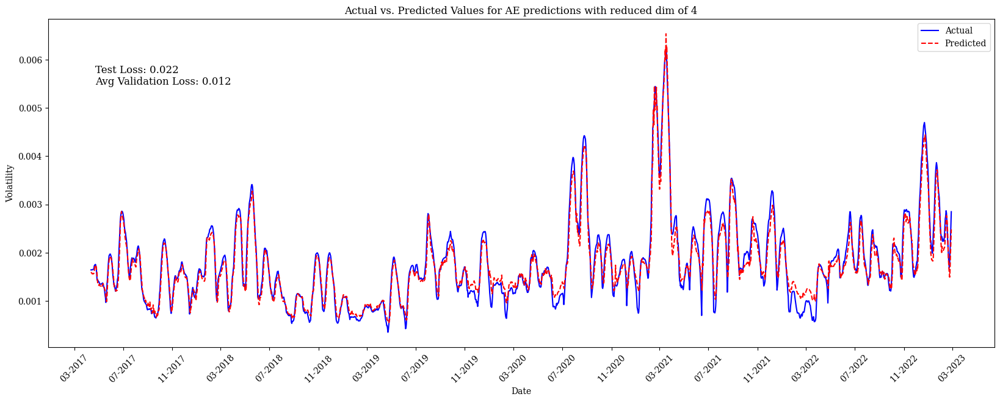

68/68 [==============================] - 1s 9ms/step - loss: 0.0220 - mae: 0.1144


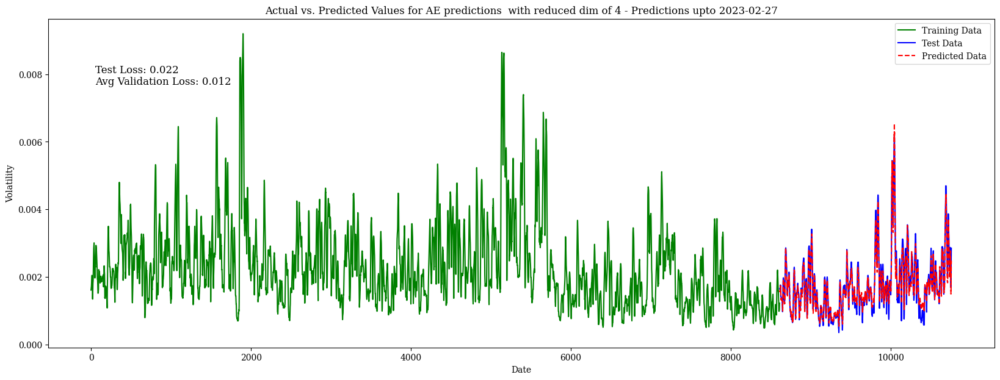

Epoch 1/100
243/243 [==============================] - 19s 47ms/step - loss: 0.3709 - val_loss: 0.2376
Epoch 2/100
243/243 [==============================] - 13s 52ms/step - loss: 0.2272 - val_loss: 0.1660
Epoch 3/100
243/243 [==============================] - 9s 36ms/step - loss: 0.1352 - val_loss: 0.1142
Epoch 4/100
243/243 [==============================] - 13s 52ms/step - loss: 0.0963 - val_loss: 0.1328
Epoch 5/100
243/243 [==============================] - 9s 38ms/step - loss: 0.0883 - val_loss: 0.1062
Epoch 6/100
243/243 [==============================] - 12s 50ms/step - loss: 0.0788 - val_loss: 0.0981
Epoch 7/100
243/243 [==============================] - 11s 44ms/step - loss: 0.0727 - val_loss: 0.0842
Epoch 8/100
243/243 [==============================] - 10s 42ms/step - loss: 0.0633 - val_loss: 0.0730
Epoch 9/100
243/243 [==============================] - 13s 52ms/step - loss: 0.0582 - val_loss: 0.0820
Epoch 10/100
243/243 [==============================] - 9s 37ms/step - loss

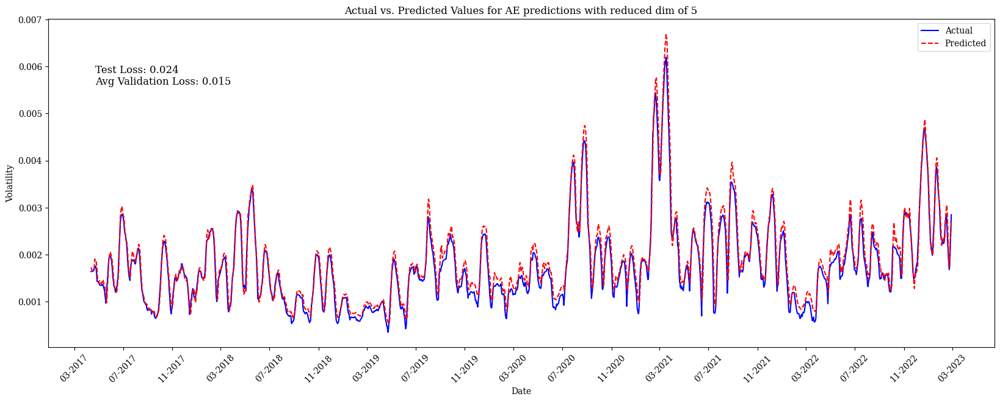

68/68 [==============================] - 1s 9ms/step - loss: 0.0237 - mae: 0.1213


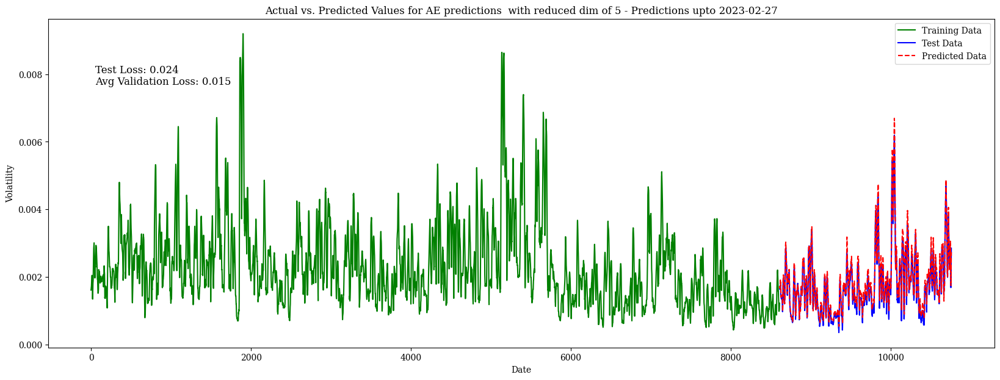

Epoch 1/100
243/243 [==============================] - 20s 51ms/step - loss: 0.3518 - val_loss: 0.2227
Epoch 2/100
243/243 [==============================] - 11s 46ms/step - loss: 0.2055 - val_loss: 0.1635
Epoch 3/100
243/243 [==============================] - 13s 54ms/step - loss: 0.1219 - val_loss: 0.1187
Epoch 4/100
243/243 [==============================] - 10s 41ms/step - loss: 0.0754 - val_loss: 0.0744
Epoch 5/100
243/243 [==============================] - 14s 56ms/step - loss: 0.0677 - val_loss: 0.0734
Epoch 6/100
243/243 [==============================] - 10s 40ms/step - loss: 0.0602 - val_loss: 0.0666
Epoch 7/100
243/243 [==============================] - 13s 55ms/step - loss: 0.0572 - val_loss: 0.0728
Epoch 8/100
243/243 [==============================] - 12s 48ms/step - loss: 0.0495 - val_loss: 0.0639
Epoch 9/100
243/243 [==============================] - 12s 48ms/step - loss: 0.0482 - val_loss: 0.0686
Epoch 10/100
243/243 [==============================] - 13s 55ms/step - l

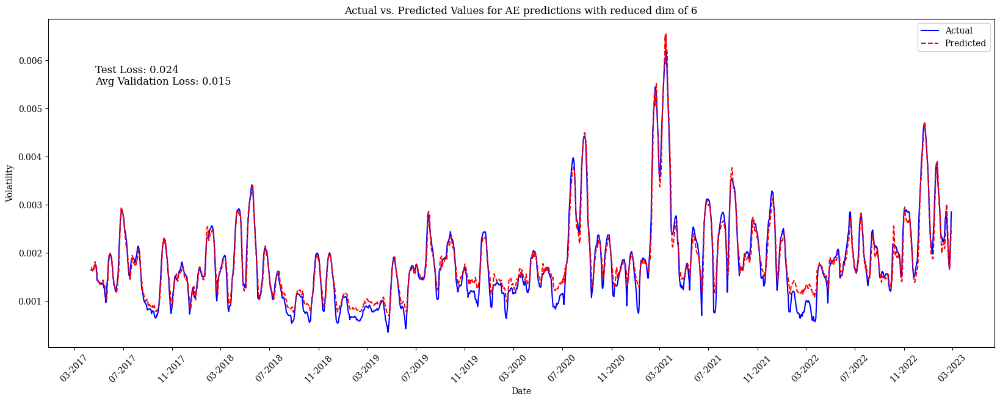

68/68 [==============================] - 1s 10ms/step - loss: 0.0237 - mae: 0.1172


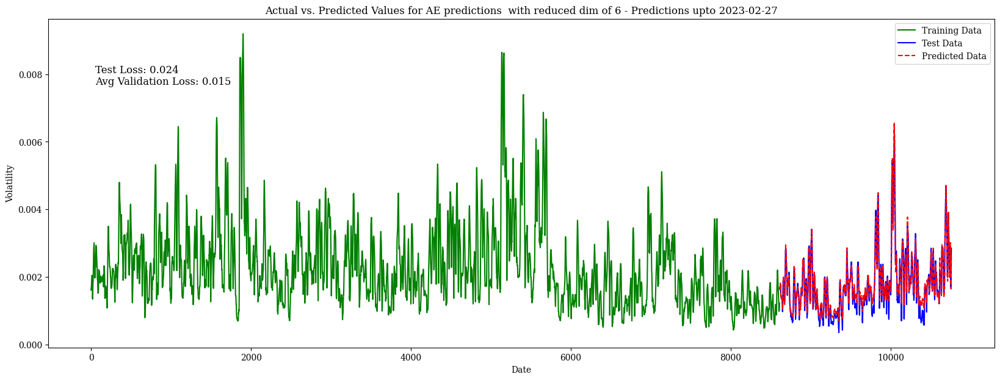

In [87]:
look_back_n = look_back - 1 # different look_back for the autoencoder
n_features_n = df.shape[1]  # 7 features
neurons_n  = n_neurons

# try different reduced dimensions
reduced_dim_range = [4, 5, 6]


for compressed_dim_n in reduced_dim_range:
  # Create a new autoencoder model
  new_autoencoder, new_encoder, es = create_new_autoencoder(look_back = look_back_n, 
                                                            n_features = n_features_n, 
                                                            compressed_dim = compressed_dim_n, 
                                                            neurons = neurons_n)

  train_data, test_data = train_test_split(df_scaled, test_size=0.2, shuffle=False)

  # Create input-output pairs for autoencoder
  X_train_ae, y_train_ae = create_input_output_pairs(train_data.values, 
                                                    look_back = look_back_n, 
                                                    horizon   = horizon)

  X_test_ae, y_test_ae = create_input_output_pairs(test_data.values, 
                                                  look_back = look_back_n, 
                                                  horizon   = horizon)


  # Train the autoencoder
  new_autoencoder.fit( X_train_ae, X_train_ae, 
                      epochs = 100, batch_size = 32, 
                      validation_split = 0.1, callbacks = [es] )

  # Use the encoder to transform the input data to the compressed form
  compressed_X_train = new_encoder.predict(X_train_ae)
  compressed_X_test = new_encoder.predict(X_test_ae)



  # train LSTM model with compressed inputs
  model_after_ae, history_after_ae = create_lstm_model(compressed_X_train, 
                                                      y_train_ae, 
                                                      n_neurons = n_neurons, 
                                                      num_steps_in = look_back_n, 
                                                      num_steps_out = horizon, 
                                                      features_n = compressed_dim_n, 
                                                      learning_rate = learning_rate, 
                                                      n_epoch = n_epoch, 
                                                      n_batch = 64, 
                                                      dropout_rate = dropout_rate, 
                                                      optimizer='adam')

  # predict volatility using compressed input dataset
  y_pred_model_after_AE = model_after_ae.predict(compressed_X_test)
  y_pred_model_after_AE.shape

  plot_predictions(model_after_ae, history_after_ae, compressed_X_test, y_test_ae, f"AE predictions with reduced dim of {compressed_dim_n}", end_date )
  plot_predictions_with_training_data(model_after_ae, history_after_ae, compressed_X_test, y_test_ae, y_train_ae, f"AE predictions  with reduced dim of {compressed_dim_n}", end_date )



In [35]:


# define hyperparameters for XGBoost
params = {
    'objective': 'reg:squarederror',
    'learning_rate': 0.001,
    'max_depth': 6,
    'min_child_weight': 1,
    'subsample': 0.8,
    'colsample_bytree': 0.8,
    'gamma': 0,
    'reg_alpha': 0,
    'reg_lambda': 1
}

# define number of iterations for ensemble
num_iterations = 5

# Split the dataset into train and test sets
train_data, test_data = train_test_split(df_scaled, test_size=0.2, shuffle=False)

# define weights for weighted average
weights = np.ones(num_iterations) / num_iterations

# Define look_back and horizon
look_back = look_back
horizon = horizon

# Create input-output pairs for XGBoost
X_train_xgb, y_train_xgb = create_input_output_pairs(train_data.values, 
                                                     look_back = look_back, 
                                                     horizon = horizon)

X_val_xgb, y_val_xgb = create_input_output_pairs(test_data.values, 
                                                 look_back = look_back, 
                                                 horizon = horizon)

# Initialize arrays to store predictions of each iteration
predictions_train = np.zeros(( X_train_xgb.shape[0], 
                               num_iterations, 
                               horizon ))

predictions_val = np.zeros(( X_val_xgb.shape[0], 
                             num_iterations, 
                             horizon ))


#  Loop through each iteration and create an LSTM model and make predictions
for i in range(num_iterations):
    np.random.seed(i)
    model, history = create_lstm_model(X_train_xgb, 
                                       y_train_xgb, 
                                       n_neurons = n_neurons, 
                                       num_steps_in = look_back, 
                                       num_steps_out = horizon, 
                                       features_n = df_scaled.shape[1], 
                                       n_epoch = 100)
    
    predictions_train[:, i, :] = model.predict(X_train_xgb)
    predictions_val[:, i, :] = model.predict(X_val_xgb)



Epoch 1/100
122/122 [==============================] - 11s 42ms/step - loss: 0.2860 - mae: 0.3753 - val_loss: 0.0825 - val_mae: 0.2343
Epoch 2/100
122/122 [==============================] - 5s 45ms/step - loss: 0.0886 - mae: 0.2134 - val_loss: 0.0241 - val_mae: 0.1170
Epoch 3/100
122/122 [==============================] - 7s 56ms/step - loss: 0.0395 - mae: 0.1436 - val_loss: 0.0172 - val_mae: 0.1019
Epoch 4/100
122/122 [==============================] - 5s 39ms/step - loss: 0.0286 - mae: 0.1233 - val_loss: 0.0118 - val_mae: 0.0834
Epoch 5/100
122/122 [==============================] - 6s 48ms/step - loss: 0.0206 - mae: 0.1047 - val_loss: 0.0085 - val_mae: 0.0737
Epoch 6/100
122/122 [==============================] - 6s 50ms/step - loss: 0.0172 - mae: 0.0959 - val_loss: 0.0079 - val_mae: 0.0733
Epoch 7/100
122/122 [==============================] - 5s 39ms/step - loss: 0.0152 - mae: 0.0895 - val_loss: 0.0050 - val_mae: 0.0550
Epoch 8/100
122/122 [==============================] - 6s 51m

In [36]:
# combine predictions using weighted average

predictions_train_ensemble = np.average(predictions_train, axis = 1, weights = weights)
predictions_val_ensemble = np.average(predictions_val, axis = 1, weights = weights)

predictions_train_ensemble_avg = np.mean(predictions_train_ensemble, axis = 1)
predictions_val_ensemble_avg = np.mean(predictions_val_ensemble, axis = 1)

y_train_ensemble_avg = np.mean(y_train_xgb, axis = 1)
y_val_ensemble_avg = np.mean(y_val_xgb, axis = 1)

# evaluate performance of ensemble
mse_train = mean_squared_error(y_train_ensemble_avg, 
                               predictions_train_ensemble_avg)

mse_val = mean_squared_error(y_val_ensemble_avg, 
                             predictions_val_ensemble_avg)

print(f"Ensemble MSE train: {mse_train:.4f}, Ensemble MSE val: {mse_val:.4f}")

Ensemble MSE train: 0.0050, Ensemble MSE val: 0.0107


In [37]:
# Denormalize best mdoel and walk 5 model data

# best walk
y_pred_best_model_denorm = denormalize_ftn(results_dict["y_pred_best"] )
X_train_best_model_denorm = denormalize_ftn(results_dict["X_train_best"] )
y_train_best_model_denorm = denormalize_ftn(results_dict["y_train_best"] )
X_test_best_model_denorm = denormalize_ftn(results_dict["X_test_best"] )
y_test_best_model_denorm = denormalize_ftn(results_dict["y_test_best"] )

# walk 5 model
y_pred_walk_5_model_denorm = denormalize_ftn(results_dict["y_pred_walk_5"] )
X_train_walk_5_model_denorm = denormalize_ftn(results_dict["X_train_walk_5"] )
y_train_walk_5_model_denorm = denormalize_ftn(results_dict["y_train_walk_5"] )
X_test_walk_5_model_denorm = denormalize_ftn(results_dict["X_test_walk_5"] )
y_test_walk_5_model_denorm = denormalize_ftn(results_dict["y_test_walk_5"] )

# Autoencoder model
y_pred_with_ae_denorm = denormalize_ftn(y_pred_model_after_AE)
y_test_with_ae_denorm = denormalize_ftn(y_test_ae)
X_test_with_ae_denorm = denormalize_ftn(compressed_X_test)
y_train_with_ae_denorm = denormalize_ftn(y_train_ae)

# Ensemble model
y_val_ensemble_denorm = denormalize_ftn(y_val_ensemble_avg) 
pred_val_ensemble_denorm = denormalize_ftn(predictions_val_ensemble_avg)
y_train_ensemble_avg_denorm = denormalize_ftn(y_train_ensemble_avg)

y_val_ensemble_denorm = y_val_ensemble_denorm.reshape(-1, 1)
pred_val_ensemble_denorm = pred_val_ensemble_denorm.reshape(-1, 1)
y_train_ensemble_avg_denorm = y_train_ensemble_avg_denorm.reshape(-1, 1)

68/68 [==============================] - 1s 9ms/step - loss: 0.0256 - mae: 0.1205


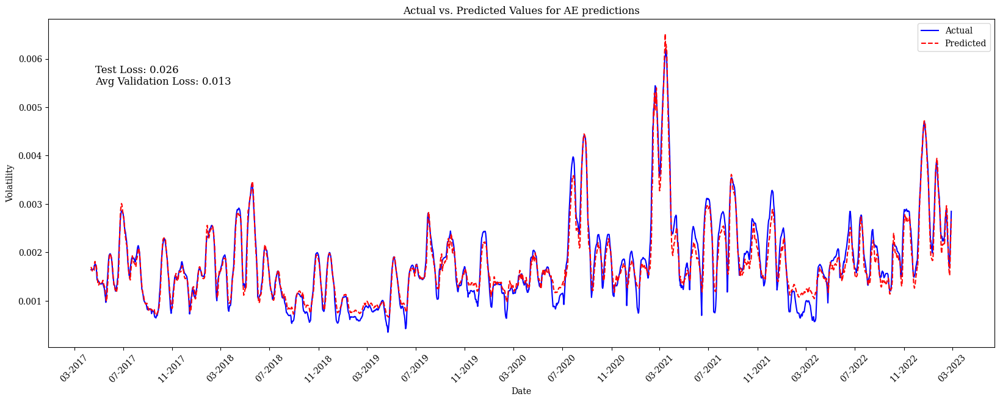

68/68 [==============================] - 1s 12ms/step - loss: 0.0256 - mae: 0.1205


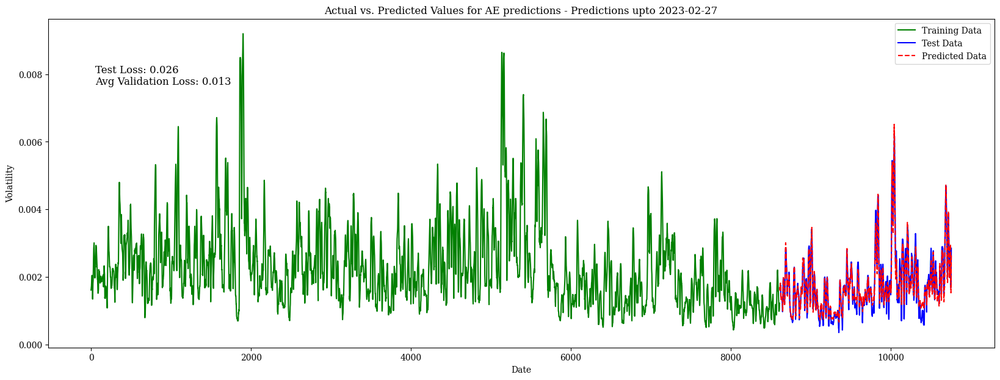

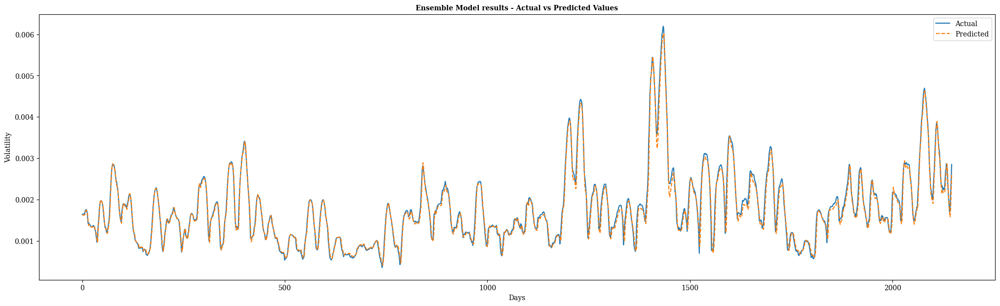

In [39]:
def plot_actual_vs_predicted(y_test_denorm, y_pred_denorm, text):
    """
    Plots the actual and predicted values.
    
    Args:
    y_test_denorm (numpy array): actual test data
    y_pred_denorm (numpy array): predicted test data
    text (string): text to display in the title of the plot
    """

    # Plot actual and predicted values
    plt.figure(figsize=(25, 7), dpi = 100)
    plt.plot(y_test_denorm, label='Actual')
    plt.plot(y_pred_denorm[:,-1],'--', label='Predicted')
    plt.legend(fontsize = fontsize)
    plt.title(f'{text} - Actual vs Predicted Values', fontsize = fontsize, fontweight = fontweight)
    plt.xlabel('Days', fontsize = fontsize)
    plt.ylabel('Volatility', fontsize = fontsize)
    plt.tick_params(axis='both', labelsize = fontsize)
    plt.show()



# Plots Ensemble Model Results
plot_actual_vs_predicted(y_val_ensemble_denorm, 
                         pred_val_ensemble_denorm, 
                         "Ensemble Model results")


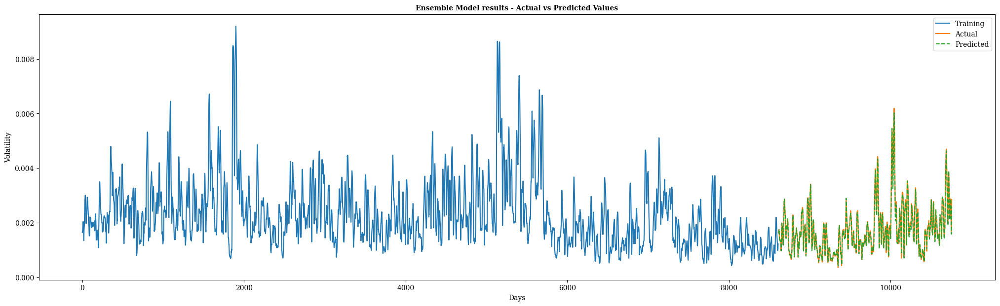

In [40]:
def plot_actual_vs_predicted(y_train_denorm, y_test_denorm, y_pred_denorm, text):
    """
    Plots actual vs predicted values for a time series prediction model.

    Parameters:
    y_train_denorm (numpy array): Training data in denormalized form.
    y_test_denorm (numpy array): Testing data in denormalized form.
    y_pred_denorm (numpy array): Predicted data in denormalized form.
    text (str): The title of the plot.

    Returns:
    None
    """
    # Set the time step for the cutoff day
    len_y_train = len(y_train_denorm)

    # Set the x-axis range
    days = range(len(y_test_denorm) + len_y_train)

    # Plot actual, predicted, and training values
    plt.figure(figsize=(25, 7), dpi = 100)

    plt.plot( days[:len_y_train], y_train_denorm[:len_y_train], 
              label = 'Training')
    
    plt.plot( days[len_y_train:], y_test_denorm, 
             label = 'Actual' )
    
    plt.plot( days[len_y_train:], y_pred_denorm, linestyle =
              '--', label = 'Predicted')
    
    plt.legend(fontsize = fontsize)

    plt.title(f'{text} - Actual vs Predicted Values', 
              fontsize = fontsize, fontweight = fontweight)
    
    plt.xlabel('Days', fontsize = fontsize)
    plt.ylabel('Volatility', fontsize = fontsize)
    plt.tick_params(axis='both', labelsize = fontsize)
    plt.show()



# Plots Ensemble Model Results
plot_actual_vs_predicted(y_train_ensemble_avg_denorm, 
                         y_val_ensemble_denorm, 
                         pred_val_ensemble_denorm, 
                         "Ensemble Model results")




In [84]:
def create_new_autoencoder(X_train_AE, look_back, n_features, compressed_dim, neurons):
    """
    Create a new autoencoder model with encoder and decoder parts, using LSTM layers.
    
    Args:
    - X_train_AE training data uncompressed
    - look_back (int): the number of time steps to look back
    - n_features (int): the number of features in the input data
    - compressed_dim (int): the number of dimensions in the compressed representation
    - neurons (int): the number of neurons in each LSTM layer
    
    Returns:
    - [Model, Model, EarlyStopping]: the autoencoder, encoder, and early stopping callback
    """
    
    # Define the input layer
    inputs = Input(shape=(look_back, n_features))

    # Define the encoder layers
    encoded = LSTM(neurons, activation = 'relu', return_sequences = True)(inputs)
    encoded = LSTM(neurons//2, activation = 'relu', return_sequences = False)(encoded)
    compressed = Dense(compressed_dim * look_back, activation = 'relu')(encoded)
    compressed = Reshape((look_back, compressed_dim))(compressed)

   # Create a new model that outputs the compressed layer
    encoder = Model(inputs, compressed)

    # Define the decoder layers
    decoded = LSTM(neurons//2, activation = 'relu', return_sequences = True)(compressed)
    decoded = LSTM(neurons, activation = 'relu', return_sequences = True)(decoded)
    decoded = Dense(n_features, activation = 'linear')(decoded)

    # Define the autoencoder model
    autoencoder = Model(inputs, decoded)


    # Compile the autoencoder model with the given loss function
    autoencoder.compile(optimizer = 'adam', loss = 'mae')


    # early stopping
    es = tf.keras.callbacks.EarlyStopping(monitor='val_loss', patience=7, mode='min', restore_best_weights=True)

    # Train the autoencoder
    autoencoder.fit( X_train_AE, X_train_AE, 
                     epochs = 100, batch_size = 32, 
                     validation_split = 0.1, callbacks = [es] )
 

    return autoencoder, encoder

In [ ]:
look_back_n = look_back - 1
n_features_n = df.shape[1]  # 7 features
compressed_dim_n = 5 # reduced dimensions
neurons_n  = n_neurons

train_data, test_data = train_test_split(df_scaled, test_size=0.2, shuffle=False)

# Create input-output pairs for autoencoder
X_train_ae, y_train_ae = create_input_output_pairs(train_data.values, 
                                                   look_back = look_back_n, 
                                                   horizon   = horizon)

X_test_ae, y_test_ae = create_input_output_pairs(test_data.values, 
                                                 look_back = look_back_n, 
                                                 horizon   = horizon)

# Create a new autoencoder model
new_autoencoder, new_encoder = create_new_autoencoder(X_train_ae, look_back = look_back_n, 
                                                          n_features = n_features_n, 
                                                          compressed_dim = compressed_dim_n, 
                                                          neurons = neurons_n)


# Use the encoder to transform the input data to the compressed form
compressed_X_train = new_encoder.predict(X_train_ae)
compressed_X_test = new_encoder.predict(X_test_ae)

In [80]:
model_after_ae, history_after_ae = create_lstm_model(compressed_X_train, 
                                                     y_train_ae, 
                                                     n_neurons = n_neurons, 
                                                     num_steps_in = look_back_n, 
                                                     num_steps_out = horizon, 
                                                     features_n = compressed_dim_n, 
                                                     learning_rate = learning_rate, 
                                                     n_epoch = 100, 
                                                     n_batch = 64, 
                                                     dropout_rate = dropout_rate, 
                                                     optimizer='adam')

y_pred_model_after_AE = model_after_ae.predict(compressed_X_test)
y_pred_model_after_AE.shape

Epoch 1/100
122/122 [==============================] - 12s 49ms/step - loss: 0.3630 - mae: 0.3607 - val_loss: 0.0306 - val_mae: 0.1390
Epoch 2/100
122/122 [==============================] - 4s 33ms/step - loss: 0.0499 - mae: 0.1631 - val_loss: 0.0207 - val_mae: 0.1081
Epoch 3/100
122/122 [==============================] - 5s 40ms/step - loss: 0.0395 - mae: 0.1452 - val_loss: 0.0166 - val_mae: 0.0991
Epoch 4/100
122/122 [==============================] - 7s 58ms/step - loss: 0.0286 - mae: 0.1242 - val_loss: 0.0234 - val_mae: 0.1318
Epoch 5/100
122/122 [==============================] - 4s 35ms/step - loss: 0.0289 - mae: 0.1236 - val_loss: 0.0113 - val_mae: 0.0787
Epoch 6/100
122/122 [==============================] - 4s 33ms/step - loss: 0.0265 - mae: 0.1193 - val_loss: 0.0402 - val_mae: 0.1756
Epoch 7/100
122/122 [==============================] - 7s 54ms/step - loss: 0.0397 - mae: 0.1436 - val_loss: 0.0099 - val_mae: 0.0759
Epoch 8/100
122/122 [==============================] - 5s 44m

(2148, 1)

68/68 [==============================] - 1s 8ms/step - loss: 0.0226 - mae: 0.1108


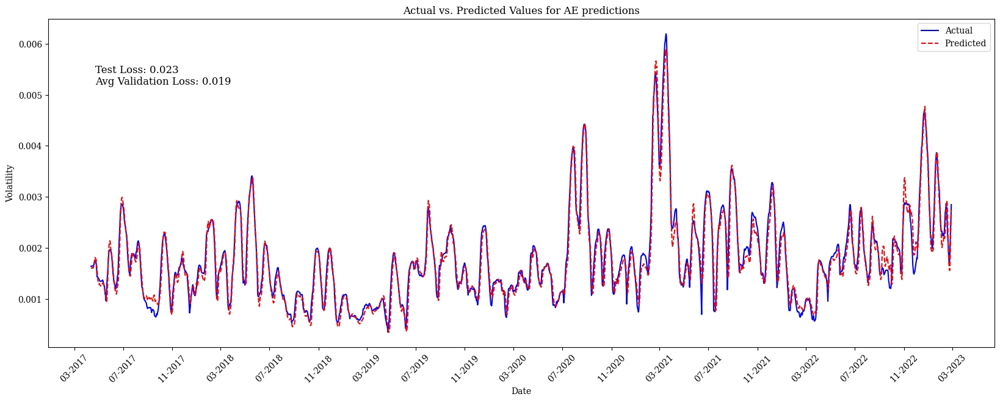

68/68 [==============================] - 1s 12ms/step - loss: 0.0226 - mae: 0.1108


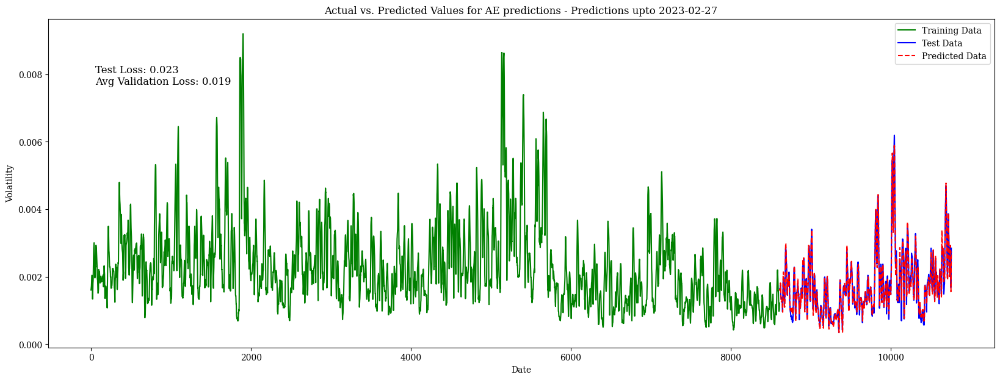

In [81]:
plot_predictions(model_after_ae, history_after_ae, compressed_X_test, y_test_ae, "AE predictions", end_date )
plot_predictions_with_training_data(model_after_ae, history_after_ae, compressed_X_test, y_test_ae, y_train_ae, "AE predictions", end_date )


In [ ]:
model_after_ae.save("model_after_ae.h5")
new_autoencoder.save("new_autoencoder.h5")
new_encoder.save("new_encoder.h5")

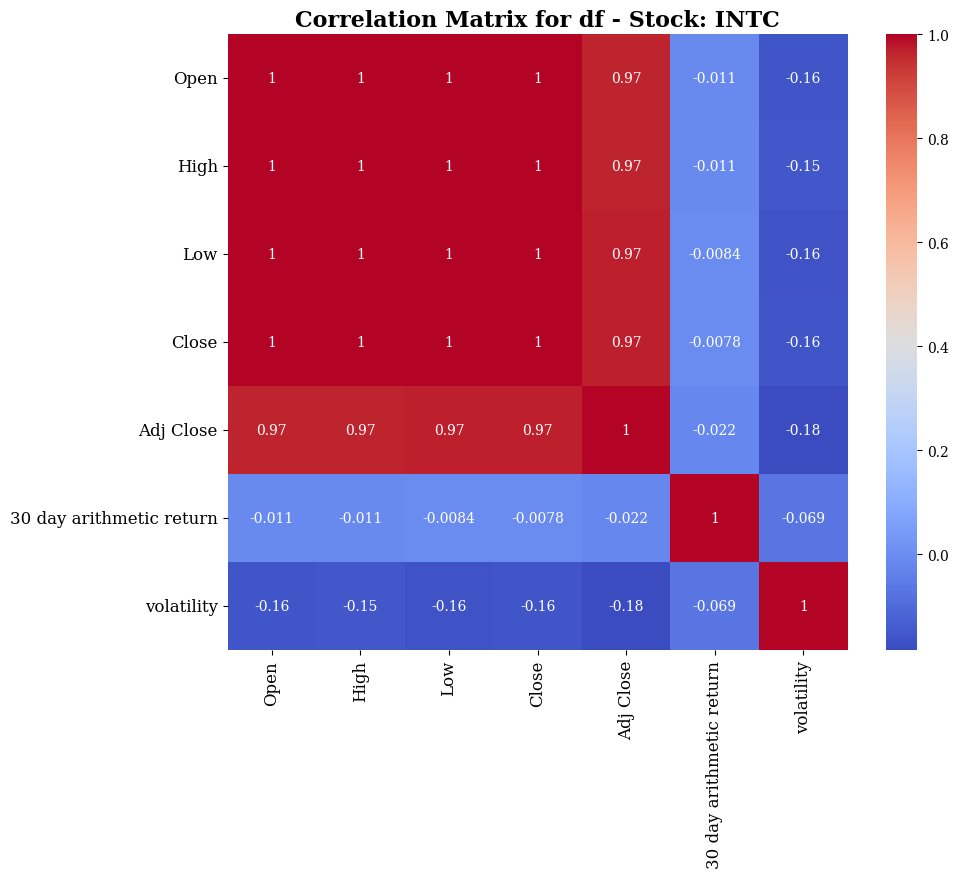

In [91]:
import seaborn as sns

# Create correlation matrix subplot
fig, ax = plt.subplots(figsize=(10, 8), dpi=100, nrows=1, ncols=1)
sns.heatmap(df.corr(), annot=True, cmap='coolwarm', ax=ax)

# Add title and adjust font size and weight
ax.set_title(f'Correlation Matrix for df - Stock: {stock_name}', fontsize=16, fontweight='bold')
plt.xticks(fontsize=12)
plt.yticks(fontsize=12)
plt.show()


References:
1. https://www.researchgate.net/publication/348249035_Forecasting_Financial_Time_Series_through_Causal_and_Dilated_Convolutional_Neural_Networks
2. https://neptune.ai/blog/cross-validation-in-machine-learning-how-to-do-it-right
3. https://analyticsindiamag.com/how-to-improve-time-series-forecasting-accuracy-with-cross-validation/
4. https://www.analyticsvidhya.com/blog/2021/06/dimensionality-reduction-using-autoencoders-in-python/
5. This one is important - Review this: https://alphascientist.com/walk_forward_model_building.html